## Banking Business Case


# Data Understanding

In [1]:
pip install Imblearn

Note: you may need to restart the kernel to use updated packages.


In [229]:
# importing libraries
import pandas as pd
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings("ignore")
import plotly.express as px
import statsmodels.api as sm
from statsmodels.genmod.generalized_linear_model import GLM
from statsmodels.genmod import families
from scipy.stats import probplot, uniform, norm
from scipy.stats import f_oneway
from scipy.stats import chi2_contingency
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import RobustScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, accuracy_score, classification_report, confusion_matrix, log_loss, roc_auc_score, roc_curve, auc

In [4]:
# reading the data in the two excel sheets
transactions_df = pd.read_excel(r"C:\Users\Ria Liz Luke\Desktop\neostats\Banking Case - Data.xlsx", sheet_name = 'Transaction Data')
transactions_df.head()

,Sno,Customer_number,Insurance,balance,housing,loan,contact,duration,campaign,last_contact_day,previous,poutcome,Term Deposit,Count_Txn
0,0,1001,no,2143,yes,no,NaN,261.0,1,2,0,unknown,no,351.0
1,1,1002,no,29,yes,no,unknown,151.0,1,2,0,unknown,no,326.0
2,2,1003,no,2,yes,yes,unknown,76.0,1,2,0,NaN,no,422.0
3,3,1004,no,1506,yes,no,unknown,92.0,1,2,0,unknown,no,113.0
4,4,1005,no,1,no,no,unknown,198.0,1,2,0,unknown,no,342.0


In [5]:
print(f"The transactions data contain {transactions_df.shape[0]} records across {transactions_df.shape[1]} variables.")

The transactions data contain 45211 records across 14 variables.


In [6]:
customer_df = pd.read_excel(r"C:\Users\Ria Liz Luke\Desktop\neostats\Banking Case - Data.xlsx", sheet_name = 'Customer Demographics')
customer_df.head() # displaying first five observations in the customers df

,Customer_number,age,job,marital,education,Annual Income,Gender
0,1001,58,management,married,tertiary,839368,M
1,1002,44,technician,single,secondary,1452858,M
2,1003,33,entrepreneur,married,NaN,4851383,F
3,1004,47,blue collar,married,unknown,3207754,F
4,1005,33,unknown,single,unknown,2562322,M


In [7]:
print(f"The transactions data contain {customer_df.shape[0]} records across {customer_df.shape[1]} variables.")

The transactions data contain 45211 records across 7 variables.


In [8]:
# merging the two dataframes using 'customer number' as primary key
df = customer_df.merge(transactions_df, on = 'Customer_number', how = 'inner')

In [9]:
merged_df = df.copy() # creating a copy of the merged df
merged_df.head()

,Customer_number,age,job,marital,education,Annual Income,Gender,Sno,Insurance,balance,housing,loan,contact,duration,campaign,last_contact_day,previous,poutcome,Term Deposit,Count_Txn
0,1001,58,management,married,tertiary,839368,M,0,no,2143,yes,no,NaN,261.0,1,2,0,unknown,no,351.0
1,1002,44,technician,single,secondary,1452858,M,1,no,29,yes,no,unknown,151.0,1,2,0,unknown,no,326.0
2,1003,33,entrepreneur,married,NaN,4851383,F,2,no,2,yes,yes,unknown,76.0,1,2,0,NaN,no,422.0
3,1004,47,blue collar,married,unknown,3207754,F,3,no,1506,yes,no,unknown,92.0,1,2,0,unknown,no,113.0
4,1005,33,unknown,single,unknown,2562322,M,4,no,1,no,no,unknown,198.0,1,2,0,unknown,no,342.0


In [10]:
print(f"The final merged data contain {merged_df.shape[0]} records across {merged_df.shape[1]} variables.")

The final merged data contain 45211 records across 20 variables.


In [11]:
# deleting Serial Number and Customer Number columns since they do not contribute to target variable
merged_df.drop(['Sno', 'Customer_number'], inplace = True, axis = 1) 

In [12]:
merged_df.columns

Index(['age', 'job', 'marital', 'education', 'Annual Income', 'Gender',
       'Insurance', 'balance', 'housing', 'loan', 'contact', 'duration',
       'campaign', 'last_contact_day', 'previous', 'poutcome', 'Term Deposit',
       'Count_Txn'],
      dtype='object')

In [13]:
# Column description
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45211 entries, 0 to 45210
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   age               45211 non-null  int64  
 1   job               45198 non-null  object 
 2   marital           45193 non-null  object 
 3   education         45190 non-null  object 
 4   Annual Income     45194 non-null  object 
 5   Gender            45211 non-null  object 
 6   Insurance         45211 non-null  object 
 7   balance           45156 non-null  object 
 8   housing           45211 non-null  object 
 9   loan              45203 non-null  object 
 10  contact           45168 non-null  object 
 11  duration          45172 non-null  float64
 12  campaign          45211 non-null  int64  
 13  last_contact_day  45211 non-null  int64  
 14  previous          45211 non-null  int64  
 15  poutcome          45196 non-null  object 
 16  Term Deposit      45203 non-null  object

The column 'balance' is stored as categorical, this is incorrect. This can happen when there are non-numerical values in the column, forcing Python to consider the column as String datatype.

In [14]:
# Analyzing the column 'balance' to handle null values
non_numeric_values = merged_df['balance'].loc[~merged_df['balance'].astype(str).str.isnumeric()].dropna()
# Print non-numeric values (if any)
non_numeric_values.unique()

array(['??', '??//', '????', '//??', '???', -32, -62, -52, -280, -205],
      dtype=object)

The characters indicate errors due to formatting issues, so it can be replaced with null values. However, negative numbers are also considered to be non-numericals. To avoid this, a custom function is defined to replace non-numerical values with Nan.

In [15]:
def replace_non_numeric(value):
    '''function to replace non numeric value with null value'''
    try:
        return pd.to_numeric(value)
    except ValueError:
        return np.nan

In [16]:
merged_df['balance'] = merged_df['balance'].apply(replace_non_numeric)

In [17]:
merged_df.describe() # Summary of Numerical variables

,age,balance,duration,campaign,last_contact_day,previous,Count_Txn
count,45211.000000,45130.000000,45172.000000,45211.000000,45211.000000,45211.000000,45210.000000
mean,40.980005,1417.212741,258.139511,2.762182,41.832253,0.580323,299.614952
std,10.838273,3022.842910,257.631452,3.087291,99.457030,2.303441,115.721788
min,18.000000,-280.000000,-167.000000,0.000000,-9.000000,0.000000,-423.000000
25%,33.000000,137.000000,103.000000,1.000000,1.000000,0.000000,200.000000
50%,39.000000,486.500000,180.000000,2.000000,1.000000,0.000000,300.000000
75%,48.000000,1440.000000,319.000000,3.000000,1.000000,0.000000,400.000000
max,121.000000,102127.000000,4918.000000,63.000000,871.000000,275.000000,499.000000


In [18]:
merged_df.describe(include='object') # Summary of Categorical variables

,job,marital,education,Annual Income,Gender,Insurance,housing,loan,contact,poutcome,Term Deposit
count,45198,45193,45190,45194,45211,45211,45211,45203,45168,45196,45203
unique,13,3,6,44972,2,2,2,2,6,7,2
top,blue-collar,married,secondary,1380371,M,no,yes,no,cellular,unknown,no
freq,9623,27202,23187,3,27168,44396,25130,37959,29282,36884,39914


In [19]:
# Checking for null values
merged_df.isna().sum()

age                  0
job                 13
marital             18
education           21
Annual Income       17
Gender               0
Insurance            0
balance             81
housing              0
loan                 8
contact             43
duration            39
campaign             0
last_contact_day     0
previous             0
poutcome            15
Term Deposit         8
Count_Txn            1
dtype: int64

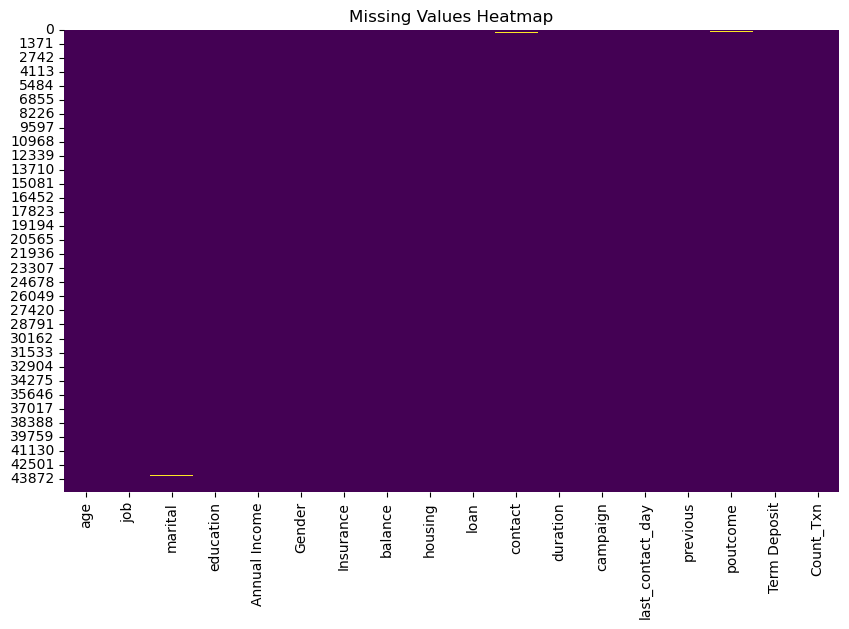

In [20]:
# visualizing missing values
plt.figure(figsize=(10, 6))
sns.heatmap(merged_df.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()

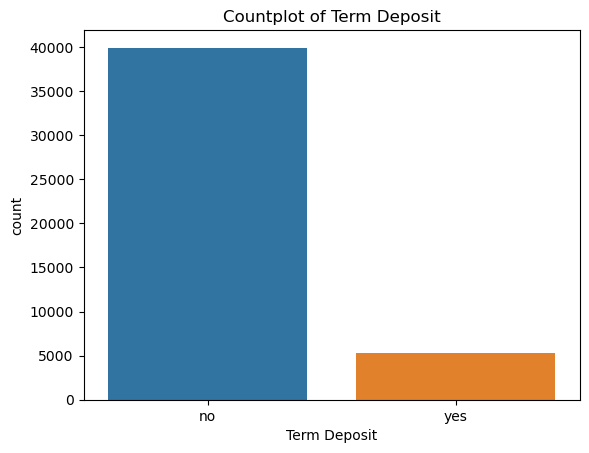

In [21]:
# checking if the data is balanced
sns.countplot(x='Term Deposit', data=merged_df)
plt.title('Countplot of Term Deposit')
plt.show()

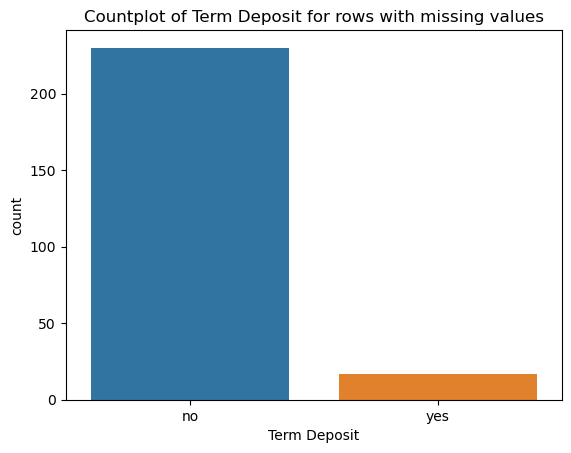

In [22]:
# Checking balance of outcome variable in rows with missing values
sns.countplot(x='Term Deposit', data=merged_df[merged_df.isna().any(axis=1)])
plt.title('Countplot of Term Deposit for rows with missing values')
plt.show()

- From the heatplot of missing values, it is observed that the number of missing values when cmpared to the whole dataset is negligible.
- However, dropping all the rows with missing values will lead to loss of rows where Term Deposit belongs to minority class. 
- This cannot happen since the data is already imbalanced, so dropping the missing values will not be the best way of handling null values. 

# Data Preparation

## 1. Handling missing values

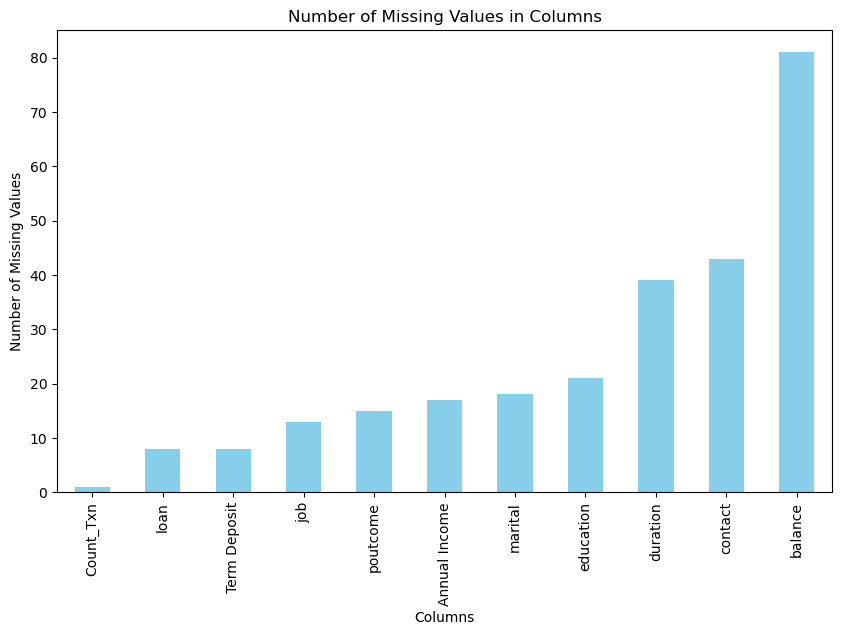

In [23]:
# Calculate missing values
missing_values = merged_df.isna().sum()
missing_values = missing_values[missing_values > 0]
missing_values.sort_values(inplace=True)

# Plotting
plt.figure(figsize=(10, 6))
missing_values.plot.bar(color='skyblue')
plt.title('Number of Missing Values in Columns')
plt.xlabel('Columns')
plt.ylabel('Number of Missing Values')
plt.show()

In [24]:
# dropping rows where the target variable - 'Term Deposit' is null
merged_df.dropna(subset = 'Term Deposit', inplace = True)

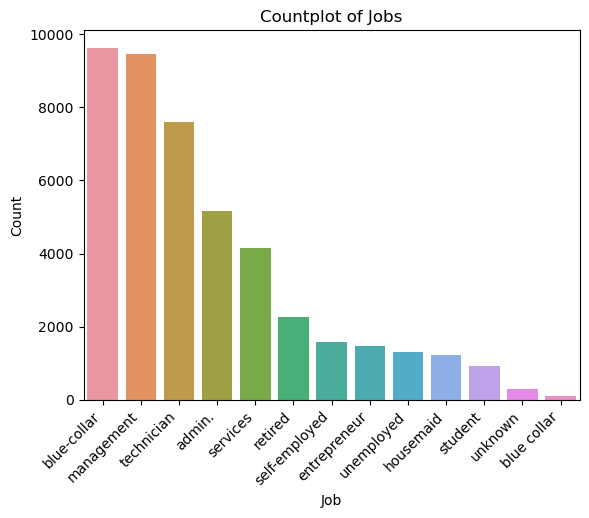

In [25]:
# There are 13 null values in the column 'job'
# Plotting the variable distribution across categories using countplot
sns.countplot(x='job', data=merged_df, order=merged_df['job'].value_counts().index)
plt.xticks(rotation=45, ha='right')  # Rotating x-axis labels for better readability
plt.title('Countplot of Jobs')
plt.xlabel('Job')
plt.ylabel('Count')
plt.show()

In [26]:
# Since 'unknown' is a category, null values are replaced as 'unknown'
merged_df['job'].fillna('unknown', inplace = True)
merged_df['job'].replace({'blue collar': 'blue-collar'}, inplace = True) 

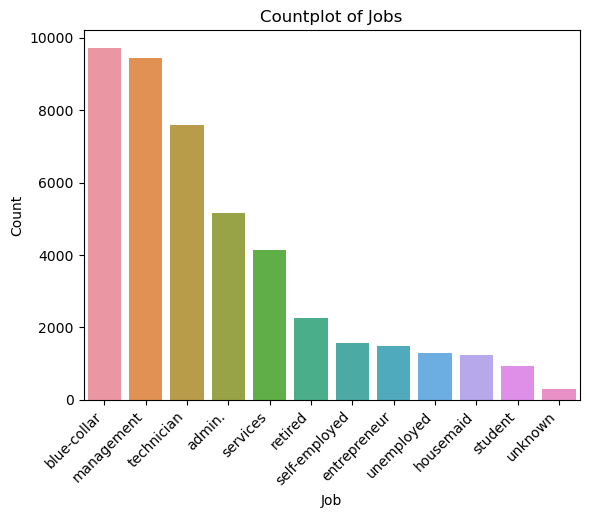

In [27]:
# modified count plot
sns.countplot(x='job', data=merged_df, order=merged_df['job'].value_counts().index)
plt.xticks(rotation=45, ha='right')  # Rotating x-axis labels for better readability
plt.title('Countplot of Jobs')
plt.xlabel('Job')
plt.ylabel('Count')
plt.show()

In [28]:
merged_df['job'].value_counts()

blue-collar      9725
management       9454
technician       7593
admin.           5171
services         4150
retired          2264
self-employed    1579
entrepreneur     1486
unemployed       1302
housemaid        1240
student           938
unknown           301
Name: job, dtype: int64

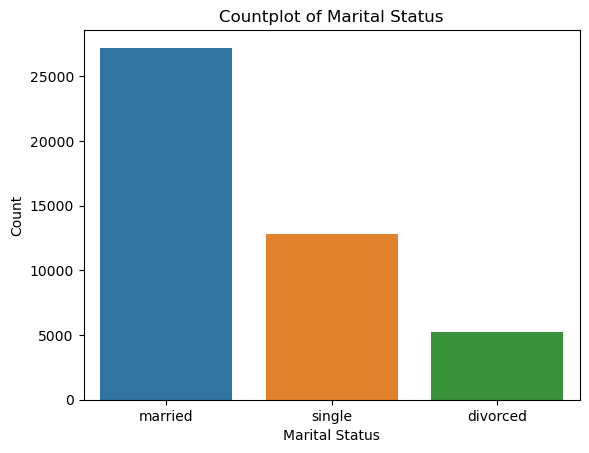

In [29]:
# visualizing distribution of marital column
sns.countplot(x='marital', data=merged_df, order=merged_df['marital'].value_counts().index)
plt.title('Countplot of Marital Status')
plt.xlabel('Marital Status')
plt.ylabel('Count')
plt.show()

Though 'married' category occurs most frequently in the data, it will be more meaningful to replace the mode of marital status among different age groups.

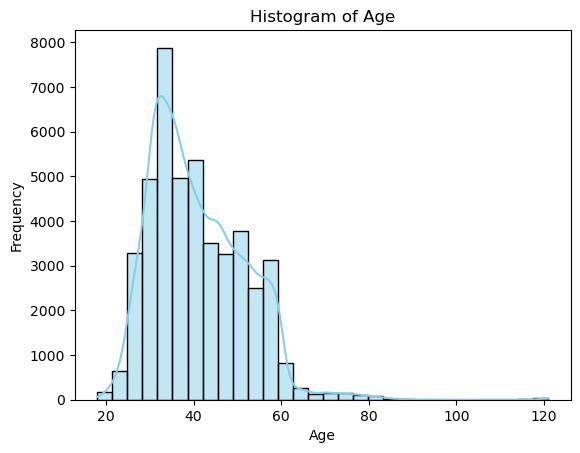

In [30]:
# Histogram to understand age distribution in the data
sns.histplot(merged_df['age'], bins=30, kde=True, color='skyblue')
plt.title('Histogram of Age')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

In [31]:
# Dividing age to different groups of age
def ageCategory(age):
    '''function to categorize age to a specific age group'''
    if age < 17:
        return "Children"
    elif 16 < age < 31:
        return "Young-Adults"
    elif 30 < age < 50:
        return "Middle-aged Adults"
    else:
        return "Old Adults"

In [32]:
# Creating new feature - age_category
merged_df['age_category'] = merged_df['age'].apply(ageCategory)

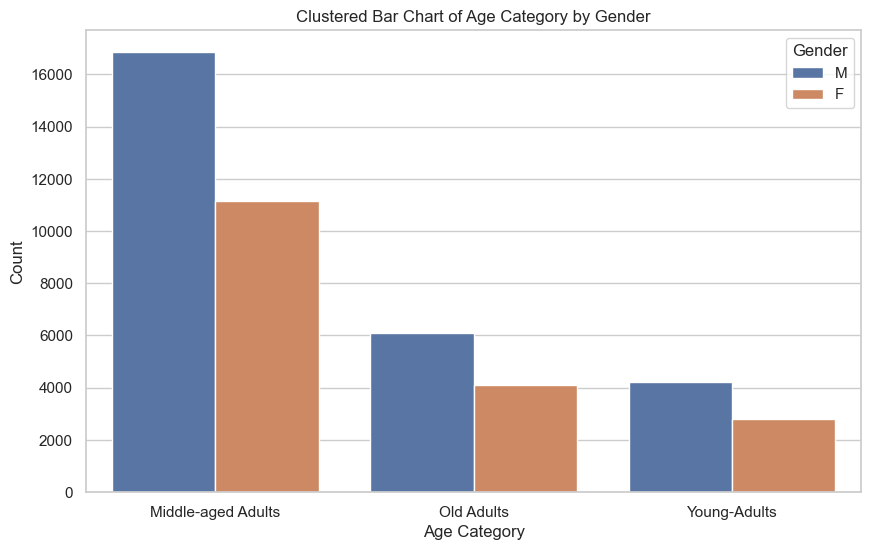

In [33]:
# Analyzing Age category across gender in the dataset
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.countplot(x='age_category', hue='Gender', data=merged_df, order=merged_df['age_category'].value_counts().index)
plt.title('Clustered Bar Chart of Age Category by Gender')
plt.xlabel('Age Category')
plt.ylabel('Count')
plt.legend(title='Gender')
plt.show()

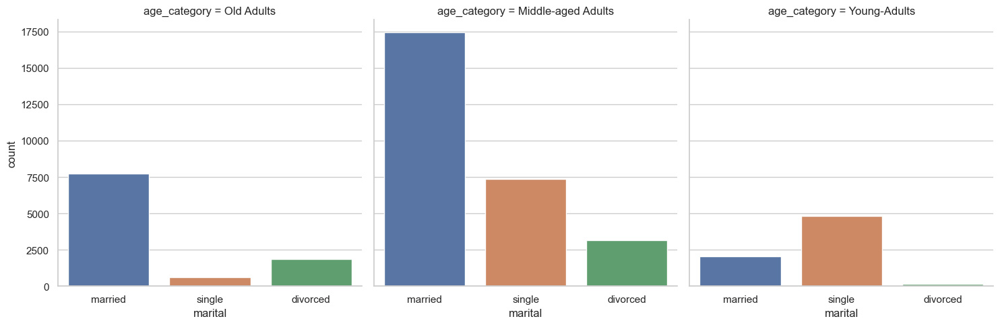

In [484]:
# Looking for mode of Marital status in each category to replace null values
sns.set(style="whitegrid")
# Creating a categorical plot with facets for each combination of features
g = sns.catplot(x='marital', col='age_category', data=merged_df, kind='count', height=5, aspect=1)
plt.show()

The following observations are made:
- Among older and middle-aged adult population, the marital status is 'married'
- Youth-Adults are more likely to be single

In [35]:
merged_df['age_category'].value_counts() 

Middle-aged Adults    27980
Old Adults            10193
Young-Adults           7030
Name: age_category, dtype: int64

In [36]:
# Replacing null values with mode of marital column in respective age category
merged_df.loc[merged_df['age_category'] == 'Young-Adults', 'marital'].fillna('single', inplace = True)
merged_df['marital'].fillna('married', inplace = True)

In [37]:
merged_df.isna().sum() # check for other columns with null values

age                  0
job                  0
marital              0
education           21
Annual Income       17
Gender               0
Insurance            0
balance             81
housing              0
loan                 8
contact             42
duration            39
campaign             0
last_contact_day     0
previous             0
poutcome            15
Term Deposit         0
Count_Txn            1
age_category         0
dtype: int64

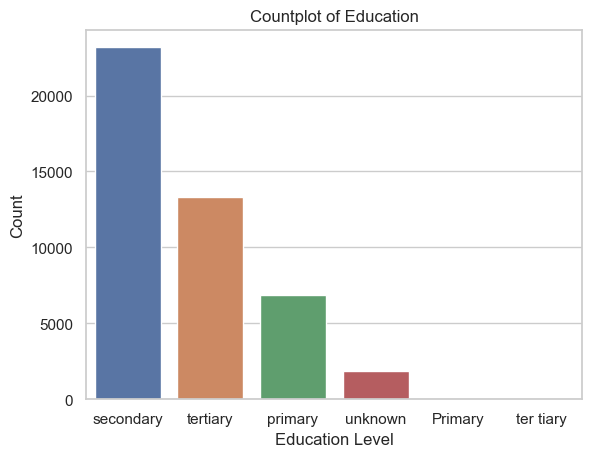

In [38]:
# Analyzing distribution of categories in the column 'education'
sns.countplot(x='education', data=merged_df, order=merged_df['education'].value_counts().index)
plt.title('Countplot of Education')
plt.xlabel('Education Level')
plt.ylabel('Count')
plt.show()

In [39]:
# replacing data entry errors
merged_df['education'].replace({'ter tiary': 'tertiary'}, inplace = True)
merged_df['education'] = merged_df['education'].str.lower()

In [40]:
merged_df['education'].value_counts()

secondary    23181
tertiary     13297
primary       6848
unknown       1856
Name: education, dtype: int64

In [41]:
# Since 'unknown' is a category, null values are replaced as 'unknown'
merged_df['education'].fillna('unknown', inplace = True)

In [42]:
# Analyzing the column 'Annual Income' to handle null values
non_numeric_values = merged_df['Annual Income'].loc[~merged_df['Annual Income'].astype(str).str.isnumeric()]
# Print non-numeric values (if any)
print("Non-numeric values:", non_numeric_values.unique())

Non-numeric values: [nan '\\']


In [43]:
# replacing data entry-error with Nan
merged_df['Annual Income'].replace(to_replace = non_numeric_values.tolist(), value = np.nan, inplace = True)

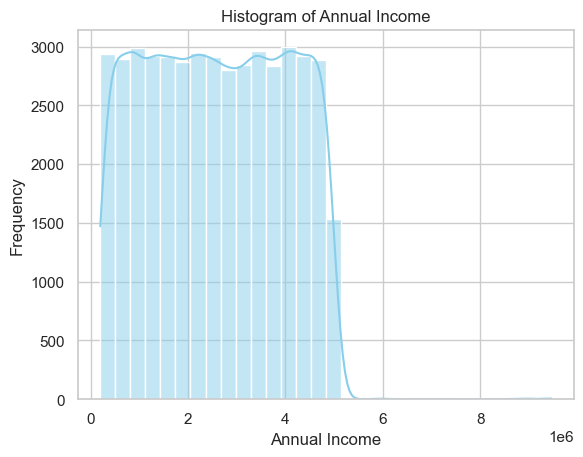

In [44]:
# Analyzing distribution of 'Annual Income'
sns.histplot(merged_df['Annual Income'].dropna(), bins=30, kde=True, color='skyblue')
plt.title('Histogram of Annual Income')
plt.xlabel('Annual Income')
plt.ylabel('Frequency')
plt.show()

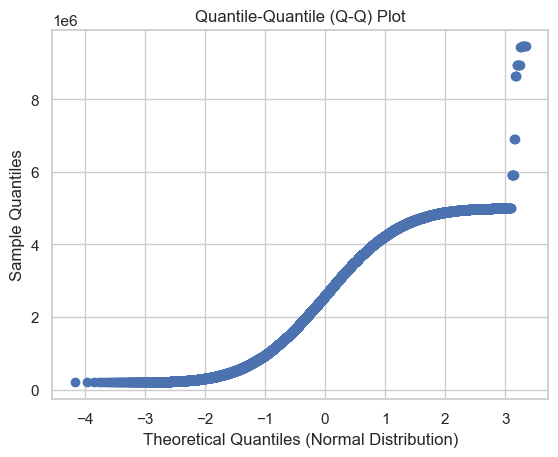

In [47]:
# Checking if data follows normal distribution
probplot_data = probplot(merged_df['Annual Income'], dist=norm, plot=plt)

# Customize the plot
plt.title('Quantile-Quantile (Q-Q) Plot')
plt.xlabel('Theoretical Quantiles (Normal Distribution)')
plt.ylabel('Sample Quantiles')
plt.show()

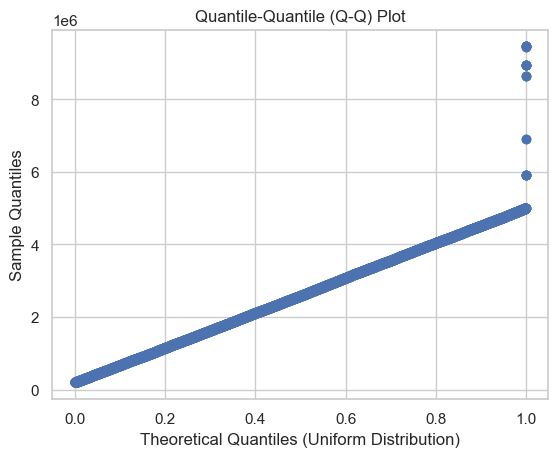

In [46]:
# Checking if data follows uniform distribution
probplot_data = probplot(merged_df['Annual Income'], dist=uniform, plot=plt)

# Customize the plot
plt.title('Quantile-Quantile (Q-Q) Plot')
plt.xlabel('Theoretical Quantiles (Uniform Distribution)')
plt.ylabel('Sample Quantiles')
plt.show()


In [48]:
# Since the data is roughly uniform, mean imputation can be done
merged_df['Annual Income'].fillna(merged_df['Annual Income'].mean(), inplace = True)

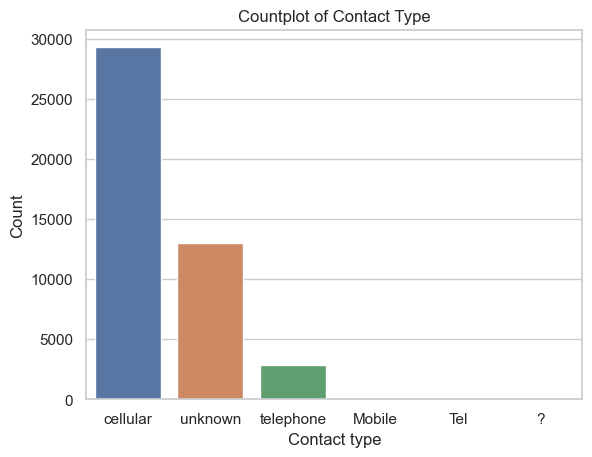

In [49]:
# Analyzing distribution of categories in 'contact' column
sns.countplot(x='contact', data=merged_df, order=merged_df['contact'].value_counts().index)
plt.title('Countplot of Contact Type')
plt.xlabel('Contact type')
plt.ylabel('Count')
plt.show()

In [50]:
# Handling data entry errors by appropriate replacement  
merged_df['contact'].replace({'Mobile': 'cellular', 'Tel': 'telephone', '?': 'unknown'}, inplace = True)

In [51]:
merged_df['contact'].value_counts()

cellular     29311
unknown      12980
telephone     2870
Name: contact, dtype: int64

In [52]:
# Since 'unknown' is a category, null values are replaced as 'unknown'
merged_df['contact'].fillna('unknown', inplace = True)

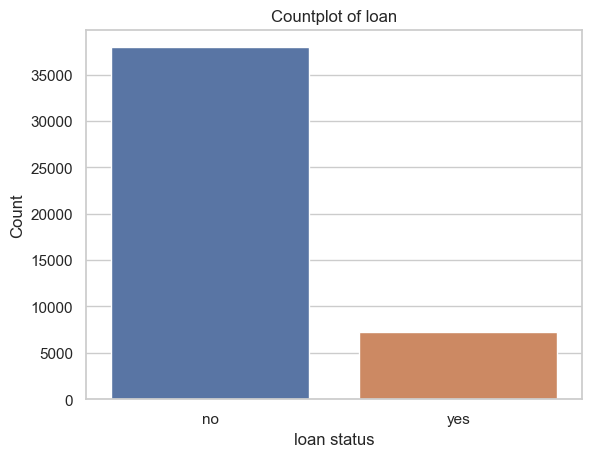

In [53]:
# Analyzing distribution of categories in 'loan' column
sns.countplot(x='loan', data=merged_df, order=merged_df['loan'].value_counts().index)
plt.title('Countplot of loan')
plt.xlabel('loan status')
plt.ylabel('Count')
plt.show()

In [54]:
# Since there is an obvious distinction, mode imputation is done
merged_df['loan'].fillna(merged_df['loan'].mode()[0], inplace = True)

In [55]:
merged_df.isna().sum() # looking for other cols with nulls

age                  0
job                  0
marital              0
education            0
Annual Income        0
Gender               0
Insurance            0
balance             81
housing              0
loan                 0
contact              0
duration            39
campaign             0
last_contact_day     0
previous             0
poutcome            15
Term Deposit         0
Count_Txn            1
age_category         0
dtype: int64

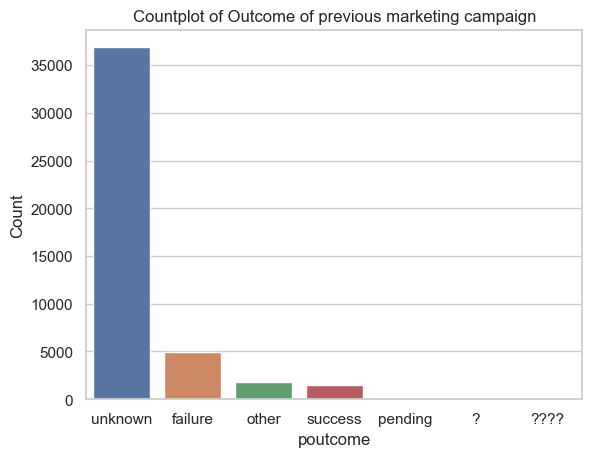

In [56]:
# Analyzing distribution of categories in 'poutcome' column
sns.countplot(x='poutcome', data=merged_df, order=merged_df['poutcome'].value_counts().index)
plt.title('Countplot of Outcome of previous marketing campaign')
plt.xlabel('poutcome')
plt.ylabel('Count')
plt.show()

In [57]:
# Handling data entry errors by appropriate replacement  
merged_df['poutcome'].replace({'?':'unknown', '????': 'unknown'}, inplace = True)

In [58]:
merged_df['poutcome'].value_counts()

unknown    36881
failure     4901
other       1840
success     1511
pending       55
Name: poutcome, dtype: int64

In [59]:
# Since there is an obvious distinction, mode imputation is done
merged_df['poutcome'].fillna(merged_df['poutcome'].mode()[0], inplace = True)

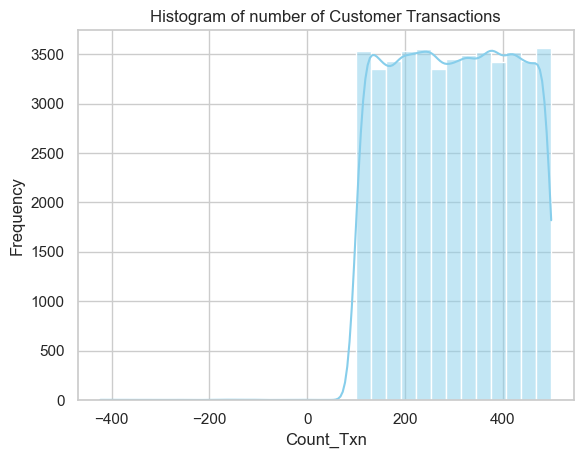

In [60]:
# Analyzing distribution of 'Number of transactions'
sns.histplot(merged_df['Count_Txn'].dropna(), bins=30, kde=True, color='skyblue')
plt.title('Histogram of number of Customer Transactions')
plt.xlabel('Count_Txn')
plt.ylabel('Frequency')
plt.show()

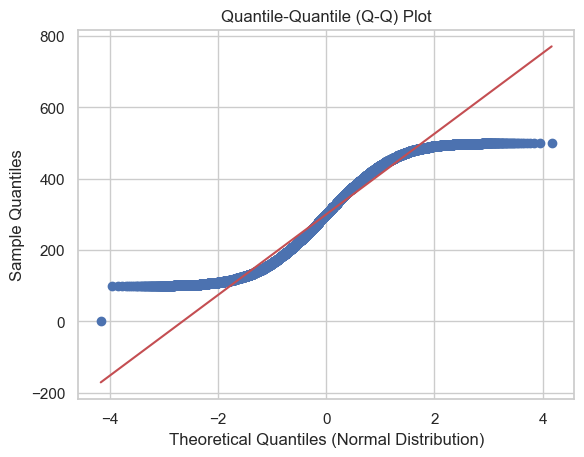

In [211]:
# Checking if data follows normal distribution
probplot_data = probplot(merged_df['Count_Txn'], dist=norm, plot=plt)

# Customize the plot
plt.title('Quantile-Quantile (Q-Q) Plot')
plt.xlabel('Theoretical Quantiles (Normal Distribution)')
plt.ylabel('Sample Quantiles')
plt.show()

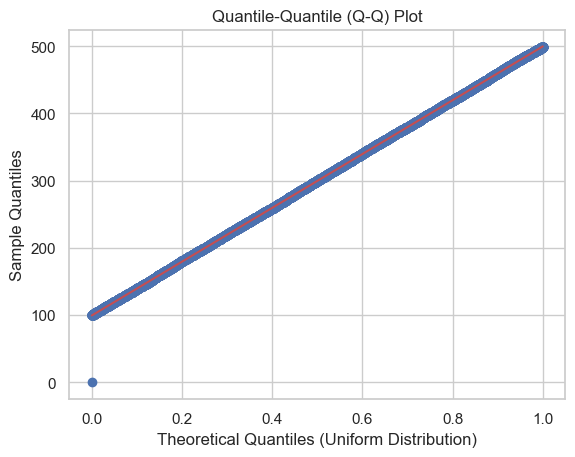

In [213]:
# Checking if data follows uniform distribution
probplot_data = probplot(merged_df['Count_Txn'], dist=uniform, plot=plt)

# Customize the plot
plt.title('Quantile-Quantile (Q-Q) Plot')
plt.xlabel('Theoretical Quantiles (Uniform Distribution)')
plt.ylabel('Sample Quantiles')
plt.show()

In [61]:
# null values are handled by mean imputation
merged_df['Count_Txn'].fillna(merged_df['Count_Txn'].mean(), inplace = True)

In [62]:
merged_df['balance'].isna().sum()

81

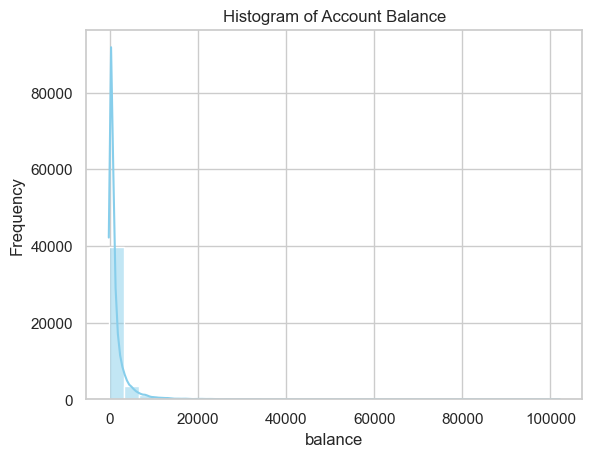

In [63]:
# Analyzing distribution of 'balance'
sns.histplot(merged_df['balance'].dropna(), bins=30, kde=True, color='skyblue')
plt.title('Histogram of Account Balance')
plt.xlabel('balance')
plt.ylabel('Frequency')
plt.show()

Since the data follows a skewed distribution, median imputation is often preferred over mean imputation because the median is less sensitive to extreme values.  

In [64]:
# Impute with median
median_duration = merged_df['balance'].median()
merged_df['balance'].fillna(median_duration, inplace=True)

In [65]:
merged_df['duration'].isna().sum()

39

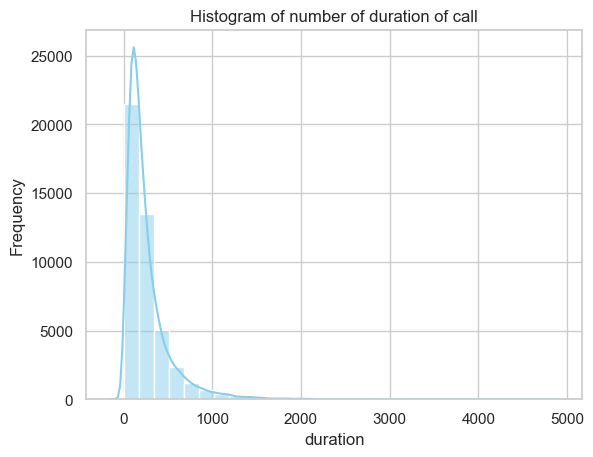

In [66]:
# Analyzing distribution of 'duration'
sns.histplot(merged_df['duration'].dropna(), bins=30, kde=True, color='skyblue')
plt.title('Histogram of number of duration of call')
plt.xlabel('duration')
plt.ylabel('Frequency')
plt.show()

Similar to the previous case, the data follows a skewed distribution, therefore median imputation is performed.

In [67]:
# Impute with median
median_duration = merged_df['duration'].median()
merged_df['duration'].fillna(median_duration, inplace=True)

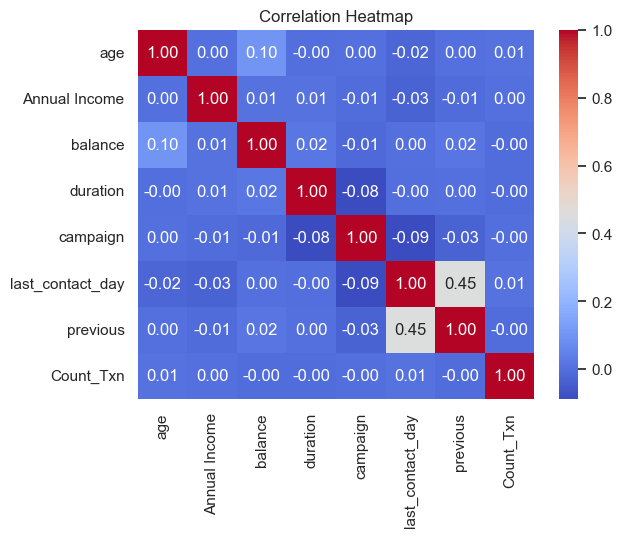

In [68]:
# Checking if any of the numerical variables are correlated
correlation_matrix = merged_df.corr()

# Creating a heatmap
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

From the heatmap, it is seen that there is no significant correlation between any of the numerical variables. The highest magnitude observed is 0.45, between columns 'last contact day' and 'previous'. 

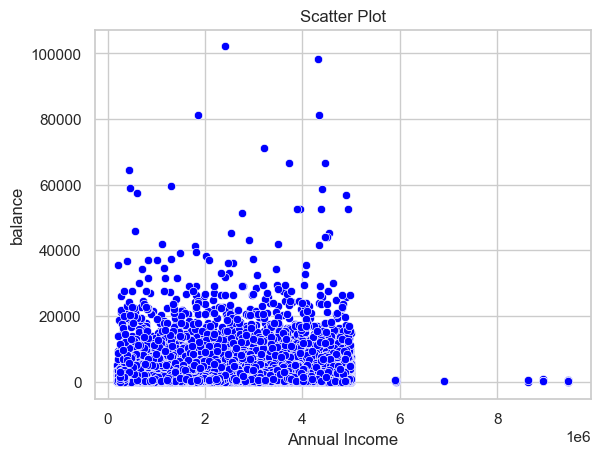

In [69]:
# Analyzing relationship between Income and balance in the data
sns.scatterplot(x='Annual Income', y='balance', data= merged_df, color='blue', marker='o')
plt.title('Scatter Plot')
plt.xlabel('Annual Income')
plt.ylabel('balance')
plt.show()

In [70]:
# storing numerical variables in a list
numerical_cols = merged_df.select_dtypes(exclude = 'object').columns
numerical_cols

Index(['age', 'Annual Income', 'balance', 'duration', 'campaign',
       'last_contact_day', 'previous', 'Count_Txn'],
      dtype='object')

## 2. Handling Outliers

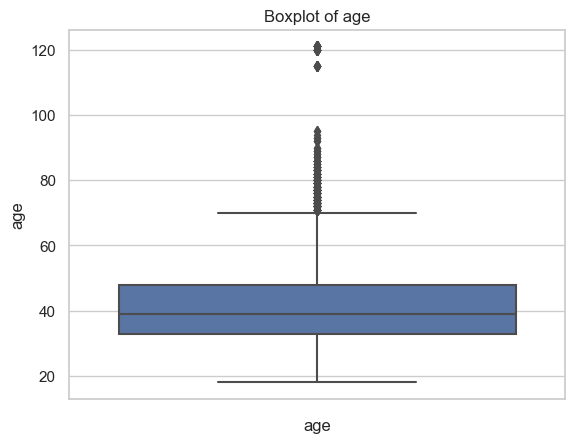

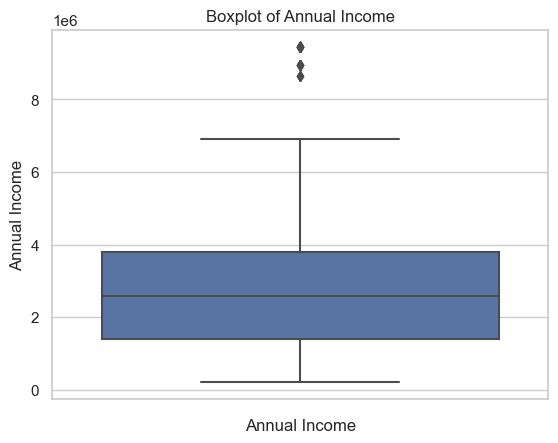

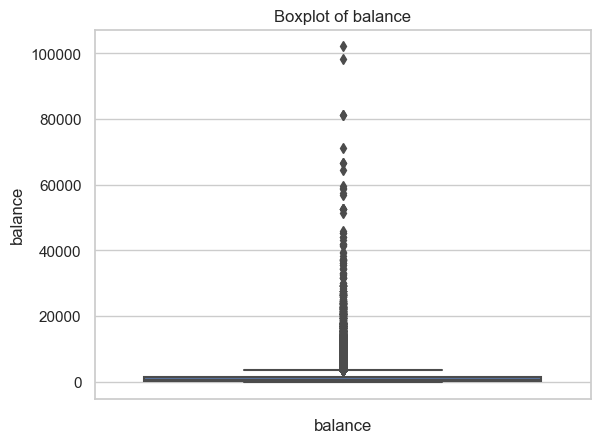

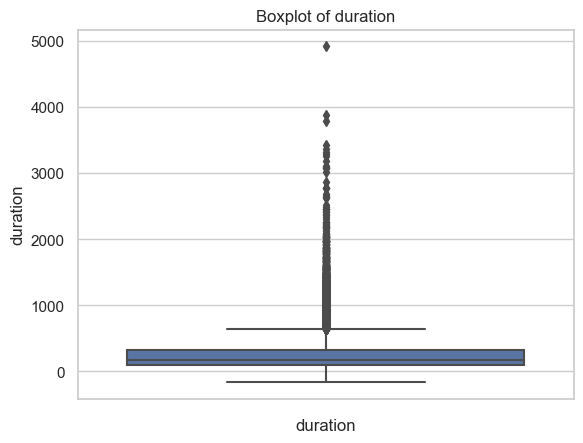

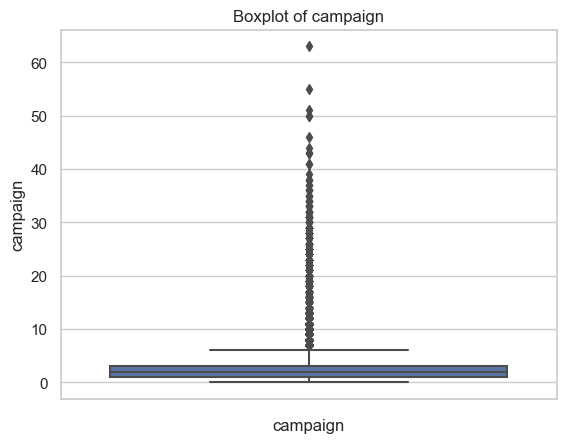

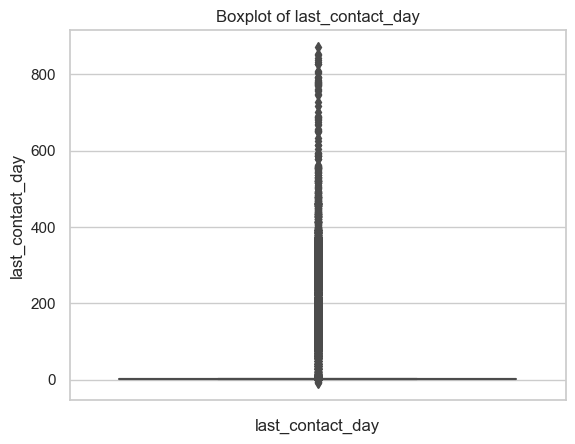

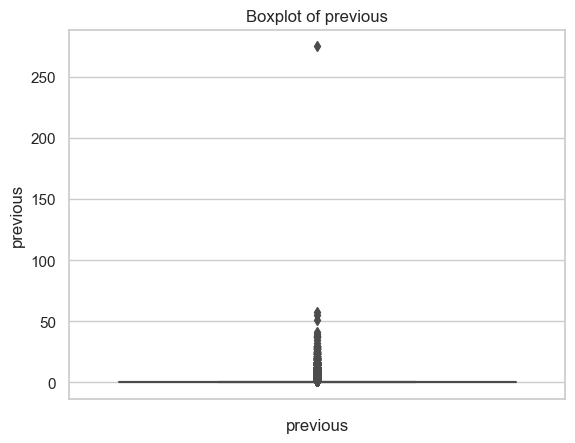

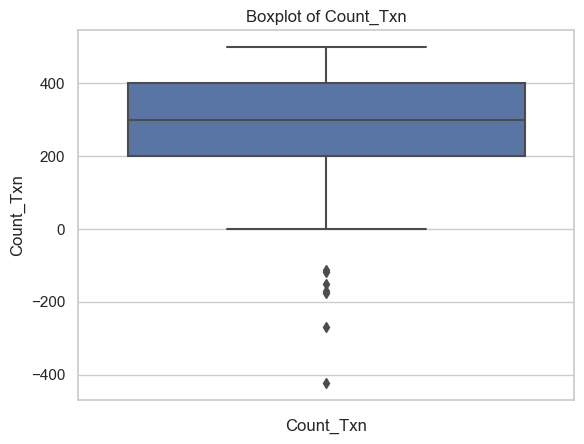

In [77]:
# Boxplot of numerical data
for col in numerical_cols:
    sns.boxplot(y= col, data= merged_df)
    plt.title(f'Boxplot of {col}')
    plt.xlabel(col)
    plt.show()

- The boxplot of age shows that there are customers whose age is greater than 120. This most likely indicates an error. Therefore, all the customers with age above a decided threshold is clipped to a certain value.
- There are five records that has negative value for number of transactions. This is assumed to be error and so these rows are omitted.

In [78]:
# defining threshold for clipping outliers in age column
upper_limit = round(merged_df['age'].mean() + 4*merged_df['age'].std())
upper_limit

84

In [79]:
# clipping outliers in age column
merged_df['age'] = np.clip(merged_df['age'], a_min = None, a_max = upper_limit)

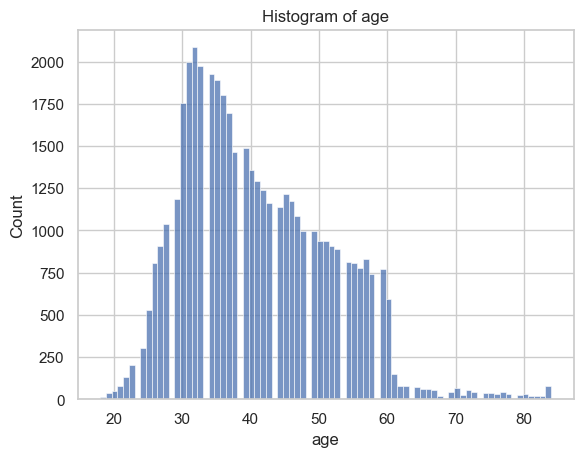

In [80]:
# Creating Histogram of Age column after removing outliers
sns.histplot(x = 'age', data= merged_df)
plt.title('Histogram of age')
plt.xlabel('age')
plt.show()

In [81]:
# Deleting records with negative value for number of transactions
merged_df = merged_df.drop(merged_df[merged_df['Count_Txn'] < 0].index)

# Data Analysis and Visualization

## 1. Income Insights

How many customers have no annual income? Plot and present the data distribution
of these customers.

In [82]:
# Filtering customers with zero Annual Income
merged_df[merged_df['Annual Income'] == 0]

,age,job,marital,education,Annual Income,Gender,Insurance,balance,housing,loan,contact,duration,campaign,last_contact_day,previous,poutcome,Term Deposit,Count_Txn,age_category


There are no customers with zero Annual Income in the dataset. Another possibility for finding customers with zero annual income is to take a look at the rows where the 'Annual Income' is missing. 

This can be done under the assumption that the customers with zero Annual Income left the field for 'Annual Income' empty indicating that it is null while filling out the survey for details.

In [83]:
# filtering rows where 'Annual Income' is null
df[df['Annual Income'].isna()]

,Customer_number,age,job,marital,education,Annual Income,Gender,Sno,Insurance,balance,housing,loan,contact,duration,campaign,last_contact_day,previous,poutcome,Term Deposit,Count_Txn
7,1008,42,entrepreneur,divorced,tertiary,NaN,F,7,yes,2,yes,no,NaN,380.0,1,2,0,pending,no,108.0
23,1024,25,services,married,secondary,NaN,M,23,no,50,yes,no,NaN,342.0,1,3,0,pending,no,426.0
4993,5994,28,admin.,married,secondary,NaN,M,4993,no,170,yes,yes,unknown,492.0,1,1,0,unknown,no,469.0
5040,6041,28,blue-collar,single,primary,NaN,M,5040,no,722,yes,no,unknown,150.0,1,1,0,unknown,no,405.0
5335,6336,32,blue-collar,married,secondary,NaN,F,5335,no,2549,yes,no,unknown,246.0,3,1,0,unknown,no,413.0
5350,6351,30,blue-collar,married,secondary,NaN,M,5350,no,253,yes,no,unknown,160.0,2,1,0,unknown,no,418.0
5412,6413,35,blue-collar,married,unknown,NaN,F,5412,no,205,yes,no,NaN,147.0,14,1,0,unknown,no,293.0
5513,6514,34,admin.,married,secondary,NaN,F,5513,no,1049,yes,no,NaN,25.0,14,1,0,unknown,no,207.0
5565,6566,44,blue collar,single,primary,NaN,M,5565,no,97,yes,no,NaN,95.0,14,1,0,unknown,no,146.0
5636,6637,31,blue-collar,married,secondary,NaN,M,5636,no,1495,yes,yes,unknown,159.0,3,1,0,unknown,no,440.0


In [113]:
# visualising education and job
temp_q1 = df[df['Annual Income'].isna()]
temp_q1['job'].unique()

array(['entrepreneur', 'services', 'admin.', 'blue-collar', 'blue collar',
       'retired', 'management'], dtype=object)

In [114]:
temp_q1['job'].replace({'blue collar': 'blue-collar'}, inplace = True)

Text(0.5, 1.0, 'Job distribution of data with missing Annual Income')

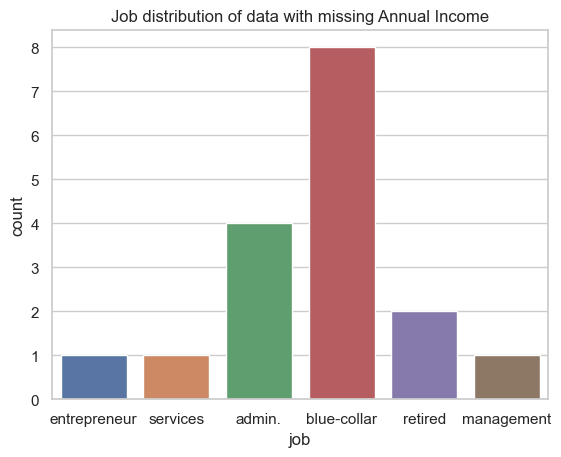

In [117]:
sns.countplot(x = temp_q1['job'])
plt.title('Job distribution of data with missing Annual Income')

Text(0.5, 1.0, 'Education qualification of data with missing Annual Income')

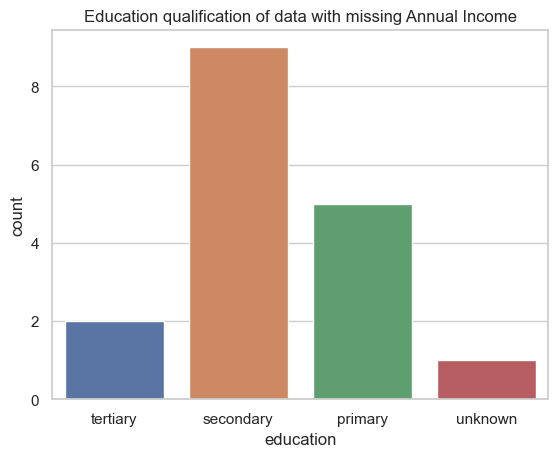

In [119]:
sns.countplot(x = temp_q1['education'])
plt.title('Education qualification of data with missing Annual Income')

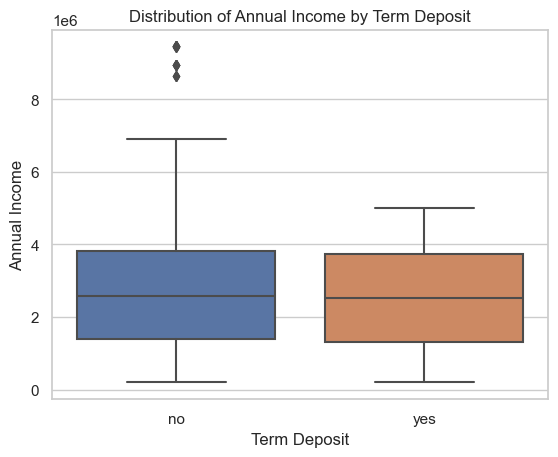

In [84]:
# Analyzing distribution of Annual Income across target variable and different features
sns.boxplot(x='Term Deposit', y='Annual Income', data= merged_df)
plt.title('Distribution of Annual Income by Term Deposit')
plt.xlabel('Term Deposit')
plt.ylabel('Annual Income')
plt.show()

From the barchart, it is seen that there is little to no difference between the two classes under Term Deposit, except for the countable number of outliers in case of customers with no term deposit. 

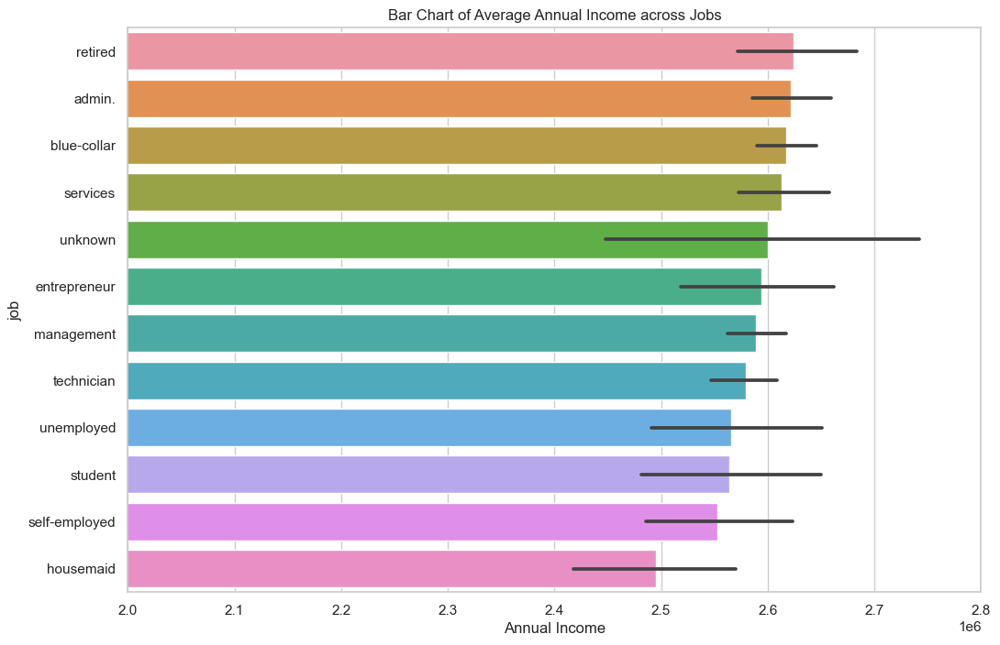

In [121]:
# grouping jobs by mean of annual income
plt.figure(figsize=(12, 8))
order = merged_df.groupby('job')['Annual Income'].mean().sort_values(ascending=False).index
sns.barplot(x ='Annual Income', y ='job', data= merged_df, dodge = True, order = order)
plt.title('Bar Chart of Average Annual Income across Jobs')
plt.ylabel('job')
plt.xlabel('Annual Income')
plt.xlim(2000000, 2800000)
plt.show()

The following observatons are made from the chart:
- Housemaids fall under the lowest Income bracket, followed by self-employed and students.
- Surprisingly, unemployed people have considerable Average Annual Income. 

In [122]:
fig = px.treemap(merged_df , path=['education'], values='Annual Income')
fig.update_layout(title='Treemap of Mean Annual Income by Education')
fig.show()

In [123]:
fig = px.treemap(merged_df , path=['Term Deposit', 'education'], values='Annual Income')
fig.update_layout(title='Treemap of Mean Annual Income by Term Deposit and Education')
fig.show()

## 2. Loan-less Customers Profile


Filter out customers who don’t have any type of loan. Plot the distribution of their
Income, balance, and profession. How do these metrics differ from those with
loans?

In [133]:
loanless_customers_df = merged_df[(merged_df['housing'] == 'no') & (merged_df['loan'] == 'no')]
loanless_customers_df.head()

,age,job,marital,education,Annual Income,Gender,Insurance,balance,housing,loan,contact,duration,campaign,last_contact_day,previous,poutcome,Term Deposit,Count_Txn,age_category,any_loan
4,33,unknown,single,unknown,2562322.0,M,no,1.0,no,no,unknown,198.0,1,2,0,unknown,no,342.0,Middle-aged Adults,no
37,53,technician,married,secondary,9455899.0,M,no,3.0,no,no,unknown,1666.0,1,1,0,pending,no,223.0,Old Adults,no
48,55,technician,divorced,secondary,4810498.0,M,no,0.0,no,no,unknown,160.0,1,1,0,pending,no,146.0,Old Adults,no
66,60,retired,married,tertiary,4249849.0,F,no,100.0,no,no,unknown,528.0,1,1,0,unknown,no,101.0,Old Adults,no
77,55,services,divorced,secondary,2497471.0,M,no,91.0,no,no,unknown,349.0,1,1,0,unknown,no,239.0,Old Adults,no


In [134]:
loanless_customers_df.shape

(17203, 20)

In [135]:
loan_df = merged_df[(merged_df['housing'] == 'yes') | (merged_df['loan'] == 'yes')]
loan_df.head()

,age,job,marital,education,Annual Income,Gender,Insurance,balance,housing,loan,contact,duration,campaign,last_contact_day,previous,poutcome,Term Deposit,Count_Txn,age_category,any_loan
0,58,management,married,tertiary,839368.0,M,no,2143.0,yes,no,unknown,261.0,1,2,0,unknown,no,351.0,Old Adults,yes
1,44,technician,single,secondary,1452858.0,M,no,29.0,yes,no,unknown,151.0,1,2,0,unknown,no,326.0,Middle-aged Adults,yes
2,33,entrepreneur,married,unknown,4851383.0,F,no,2.0,yes,yes,unknown,76.0,1,2,0,unknown,no,422.0,Middle-aged Adults,yes
3,47,blue-collar,married,unknown,3207754.0,F,no,1506.0,yes,no,unknown,92.0,1,2,0,unknown,no,113.0,Middle-aged Adults,yes
5,35,management,married,tertiary,3960603.0,M,no,231.0,yes,no,unknown,139.0,1,2,0,unknown,no,490.0,Middle-aged Adults,yes


In [136]:
loan_df.shape

(28000, 20)

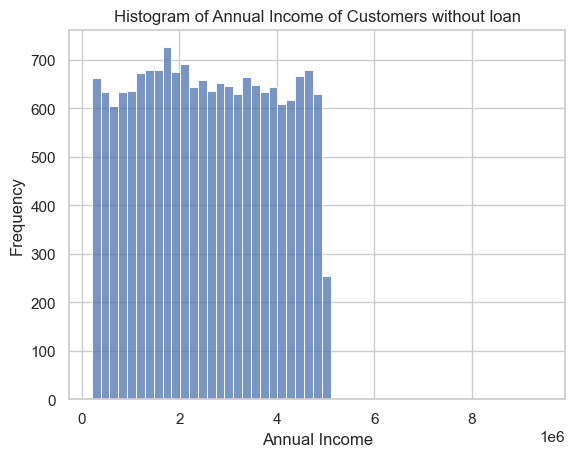

In [137]:
sns.histplot(x = 'Annual Income', data= loanless_customers_df)
plt.title('Histogram of Annual Income of Customers without loan')
plt.xlabel('Annual Income')
plt.ylabel('Frequency')
plt.show()

In [138]:
fig = px.histogram(loanless_customers_df, x = 'balance', title='Distribution of balance of Customers without loan')
fig.show()

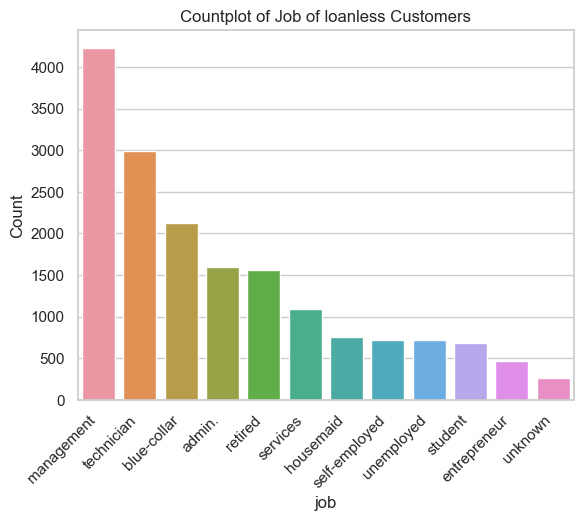

In [139]:
sns.countplot(x='job', data=loanless_customers_df, order=loanless_customers_df['job'].value_counts().index)
plt.title('Countplot of Job of loanless Customers')
plt.xticks(rotation = 45, ha = 'right')
plt.xlabel('job')
plt.ylabel('Count')
plt.show()

In [82]:
# for comparison, a new column is created that indicates whether or not the customer has any type of loan.
merged_df['any_loan'] = np.nan
merged_df['any_loan'] = merged_df[(merged_df['housing'] == 'no') & (merged_df['loan'] == 'no')]['any_loan'].fillna('no')
merged_df['any_loan'] = merged_df['any_loan'].fillna('yes')

In [83]:
merged_df['any_loan'].value_counts()

yes    28000
no     17203
Name: any_loan, dtype: int64

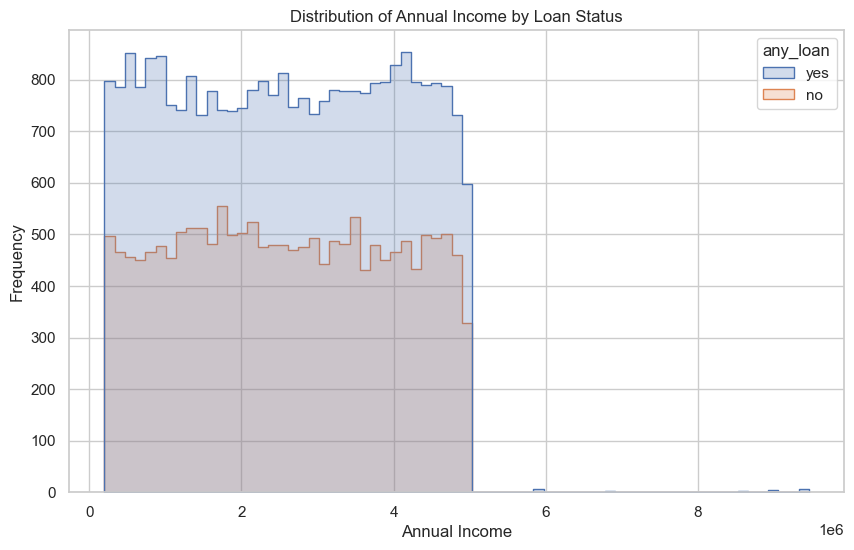

In [92]:
# Set the style of seaborn
sns.set(style="whitegrid")

# Create a histogram using seaborn
plt.figure(figsize=(10, 6))
sns.histplot(data=merged_df, x='Annual Income', hue='any_loan', element="step", stat="count")

# Set the title and labels
plt.title('Distribution of Annual Income by Loan Status')
plt.xlabel('Annual Income')
plt.ylabel('Frequency')

# Show the plot
plt.show()

- The Annual Income range of all the customers in the data is.between 200k and 5M with few earning more than that.
- In every range, number of people without Loan is greater that those with loan.

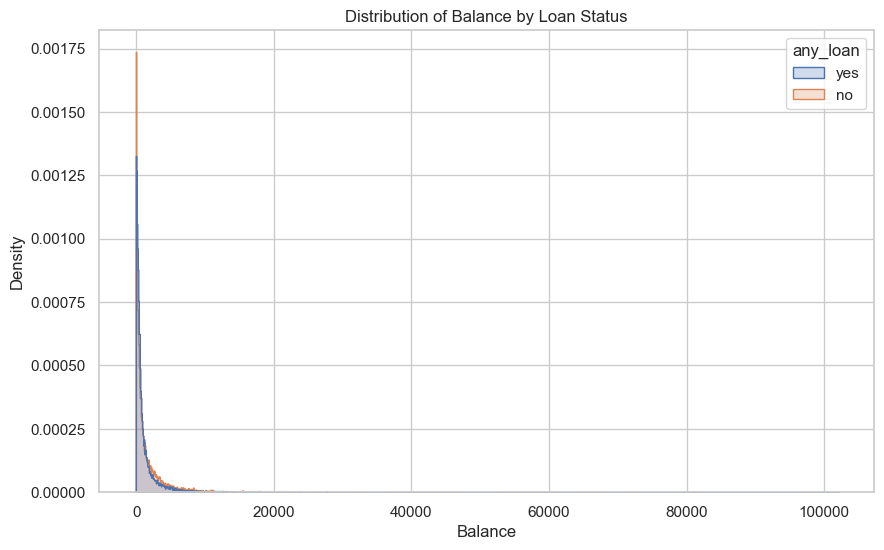

In [94]:
# Histogram for comparing Balance among two groups
plt.figure(figsize=(10, 6))
sns.histplot(data=merged_df, x='balance', hue='any_loan', element="step", stat="density", common_norm=False)

# Setting the title and labels
plt.title('Distribution of Balance by Loan Status')
plt.xlabel('Balance')
plt.ylabel('Density')
plt.show()

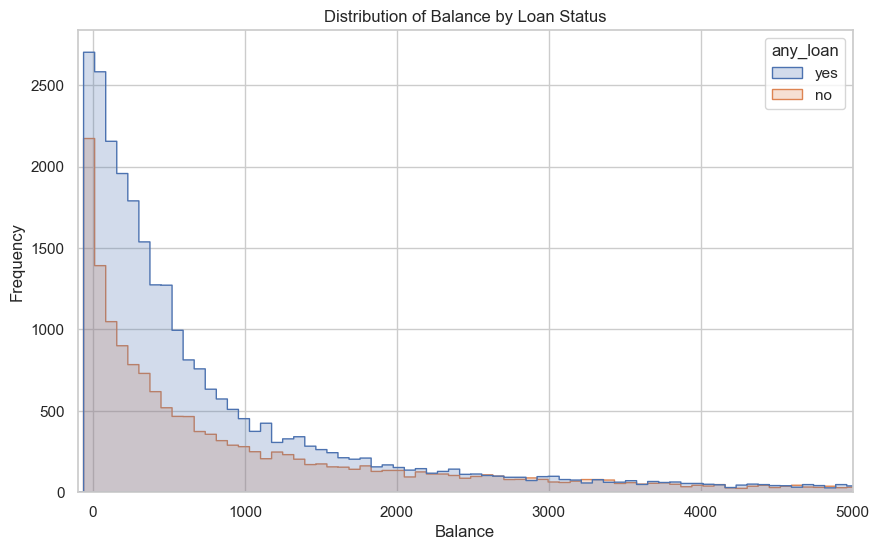

In [126]:
# Histogram for comparing Balance among two groups
plt.figure(figsize=(10, 6))
sns.histplot(data=merged_df, x='balance', hue='any_loan', element="step", stat="count")

# Setting the title and labels
plt.title('Distribution of Balance by Loan Status')
plt.xlabel('Balance')
plt.ylabel('Frequency')
plt.xlim(-100, 5000)
plt.show()

- Among people with very low balance, there is a larger number of people with loan compared to those without.
- The number of people without loan gradually increases as the balance increases.

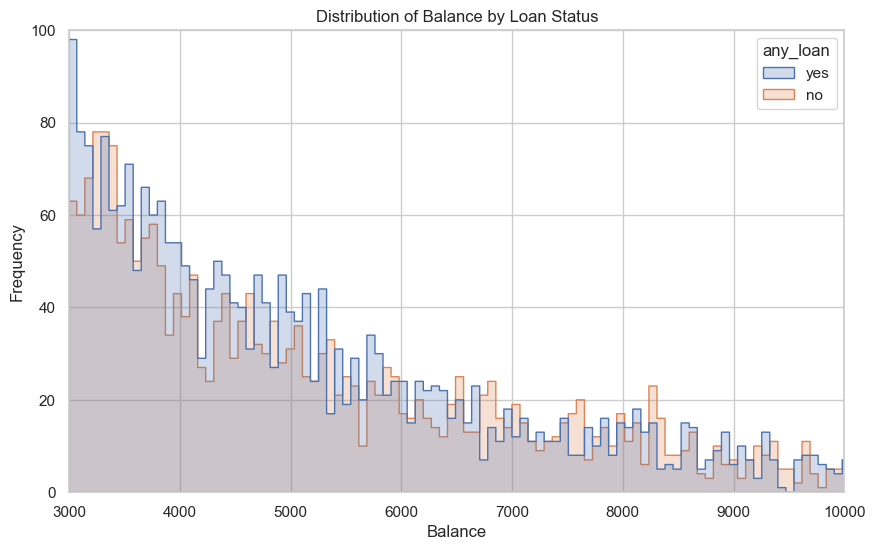

In [127]:
# Histogram for comparing Balance among two groups
plt.figure(figsize=(10, 6))
sns.histplot(data=merged_df, x='balance', hue='any_loan', element="step", stat="count")

# Setting the title and labels
plt.title('Distribution of Balance by Loan Status')
plt.xlabel('Balance')
plt.ylabel('Frequency')
plt.xlim(3000, 10000)
plt.ylim(0, 100)
plt.show()


In [128]:
job_percentages = merged_df['job'].value_counts(normalize=True) * 100

# Creating a new DataFrame with the calculated percentages
percentage_df = pd.DataFrame({
    'job': job_percentages.index,
    'percentage': job_percentages.values
})

In [129]:
loan_yes_counts = merged_df[merged_df['any_loan'] == 'yes']['job'].value_counts()
loan_no_counts = merged_df[merged_df['any_loan'] == 'no']['job'].value_counts()

jobs = merged_df['job'].unique()
butterfly_df = pd.DataFrame({
    'Job': np.concatenate([loan_yes_counts.index, loan_no_counts.index]),
    'Count': np.concatenate([loan_yes_counts.values, -loan_no_counts.values]),
    'Loan Status': np.concatenate([np.tile('yes', len(jobs)), np.tile('no', len(jobs))])
})

# Creating the butterfly chart using Plotly Express
fig = px.bar(butterfly_df, x='Count', y='Job', orientation='h',
             color='Loan Status', color_discrete_sequence=['skyblue', 'salmon'],
             labels={'Count': 'Job Count', 'Job': 'Job'},
             title='Distribution of Profession by Loan Status')

# Setting axis labels and tick orientation
fig.update_layout(xaxis_title='Job Count', yaxis_title='Job', yaxis_categoryorder='total ascending')

fig.show()


- Most loan recipients work in blue-collar jobs.
- Retirees, despite having the highest average income, have a lower loan proportion.
- Unemployed customers show a near equal split between those with and without loans.
- Lower-income occupations often have more individuals without loans than with loans.

## 3. Loan and Insurance Analysis

Calculate the percentage of customers with a loan who have taken out insurance.
Visualize this data and discuss potential implications.

In [140]:
print(f"{round(loan_df['Insurance'].value_counts(normalize=True).get('yes') * 100, 1)} % of customers with a loan have taken out insurance")

2.2 % of customers with a loan have taken out insurance


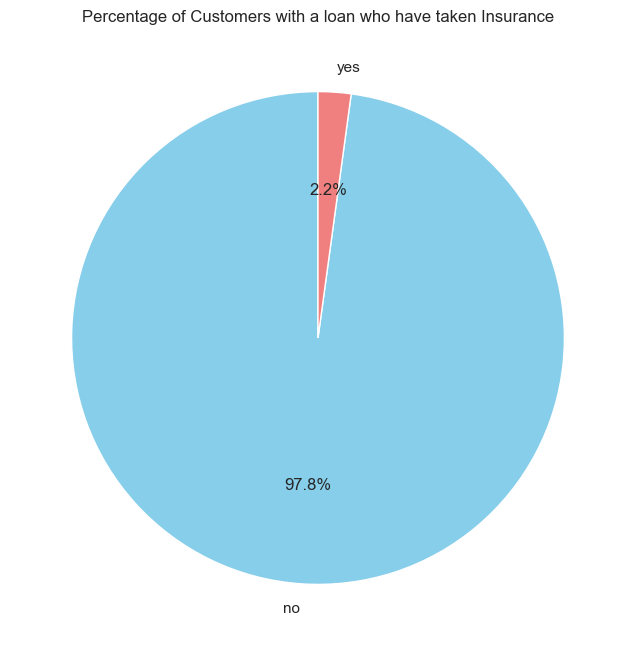

In [143]:
# Create a pie chart
insurance_percentage = loan_df['Insurance'].value_counts(normalize=True) * 100
plt.figure(figsize=(8, 8))
plt.pie(insurance_percentage, labels=insurance_percentage.index, autopct='%1.1f%%', startangle=90, colors=['skyblue', 'lightcoral'])

plt.title('Percentage of Customers with a loan who have taken Insurance')
plt.show()

In [144]:
insurance_df = loan_df[loan_df['Insurance'] == 'yes']
insurance_df.head()

,age,job,marital,education,Annual Income,Gender,Insurance,balance,housing,loan,contact,duration,campaign,last_contact_day,previous,poutcome,Term Deposit,Count_Txn,age_category,any_loan
7,42,entrepreneur,divorced,tertiary,2.596422e+06,F,yes,2.0,yes,no,unknown,380.0,1,2,0,pending,no,108.0,Middle-aged Adults,yes
79,55,services,divorced,secondary,2.661959e+06,F,yes,1.0,yes,no,unknown,208.0,1,1,0,unknown,no,150.0,Old Adults,yes
419,33,technician,married,secondary,1.594170e+06,F,yes,72.0,yes,no,unknown,623.0,1,1,0,unknown,no,410.0,Middle-aged Adults,yes
562,35,entrepreneur,married,secondary,2.214528e+06,M,yes,204.0,yes,no,unknown,424.0,2,1,0,unknown,no,485.0,Middle-aged Adults,yes
572,41,blue-collar,single,primary,4.973772e+06,F,yes,137.0,yes,yes,unknown,189.0,1,1,0,unknown,no,404.0,Middle-aged Adults,yes


In [145]:
insurance_df.shape

(603, 20)

In [151]:
fig = px.treemap(insurance_df , path=['loan', 'job'], values='Annual Income')
fig.update_layout(title='Treemap of Mean Annual Income by Loan and Job')
fig.show()

Text(0.5, 1.0, 'Marital Status and Gender Pattern')

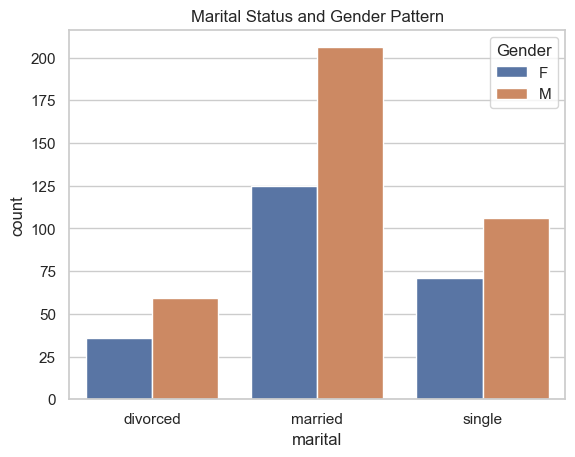

In [192]:
sns.countplot(x = 'marital', hue = 'Gender', data = insurance_df)
plt.title('Marital Status and Gender Pattern')

In [184]:
insurance_percentage = insurance_df['Term Deposit'].value_counts(normalize = True).get('yes')
merged_percentage = loan_df[~loan_df.isin(insurance_df)]['Term Deposit'].value_counts(normalize = True).get('yes')

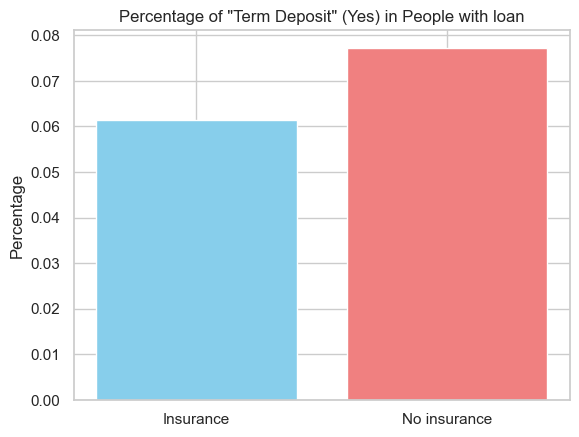

In [186]:
labels = ['Insurance', 'No insurance']
values = [insurance_percentage, merged_percentage]

plt.bar(labels, values, color=['skyblue', 'lightcoral'])
plt.title('Percentage of "Term Deposit" (Yes) in People with loan')
plt.ylabel('Percentage')
plt.show()

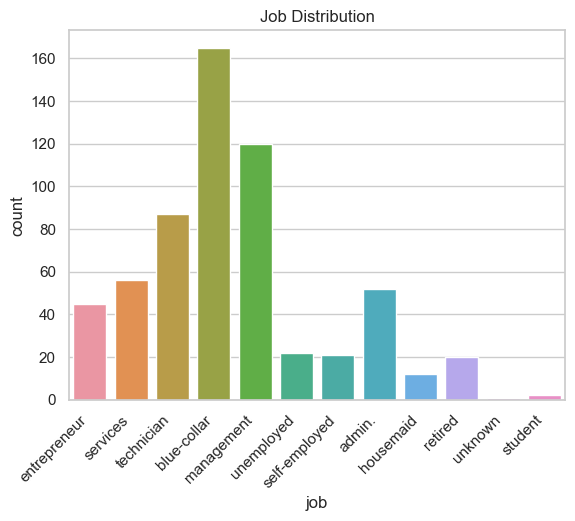

In [191]:
sns.countplot(x = 'job', data = insurance_df)
plt.title('Job Distribution')
plt.xticks(rotation = 45, ha = 'right')
plt.show()

- 2.2 % of customers with a loan have taken out insurance
- 603 customers out of 27993 have taken insurance.
- Among people with loan, those with insurance are less likely to take Term Deposit compared to those without Insurance.
- Married people with loan are seen to have taken most number of insurances compared to other categories.
- People in Blue-collar occupations are dominating in this data.

# 4. Communication Strategy Insights

Analyse and summarize the best Contact method (with the highest success percentage) to contact people to ascertain the status of term deposit subscriptions.

In [193]:
merged_df['contact'].value_counts()

cellular     29311
unknown      13022
telephone     2870
Name: contact, dtype: int64

In [194]:
temp_df = merged_df.groupby('contact')['Term Deposit'].value_counts(normalize=True).unstack()
temp_df

Term Deposit,no,yes
contact,,
cellular,0.850977,0.149023
telephone,0.864460,0.135540
unknown,0.959146,0.040854


In [195]:
fig = px.bar(temp_df['yes']*100)
fig.update_layout(title='Success Percentage Across Contact Methods for Term Deposit Subscriptions', yaxis_title = 'Percentage')
fig.show()

When customers were contacted by cellular mode of contact, the highest success percentage was observed.

In [196]:
temp2 =pd.DataFrame(temp_df['yes']*100).reset_index()

In [197]:
fig = px.pie(temp2, values = 'yes', names = 'contact', color_discrete_sequence = px.colors.sequential.RdBu, opacity = 0.7, hole = 0.5,
            title = 'Sucess of Contact Method as a percentage across all Contact Methods') 
fig.show()

When customers were contacted by cellular mode of contact, the highest success percentage was observed.

## 5. Age and Home Loans

Determine which age group has the highest percentage of home loans. Present this
data visually and discuss possible reasons.

In [198]:
merged_df['age_category'].value_counts()

Middle-aged Adults    27980
Old Adults            10193
Young-Adults           7030
Name: age_category, dtype: int64

In [199]:
fig = px.box(merged_df, x='housing', y='age')
fig.show()

In [200]:
temp_df2 = pd.DataFrame(merged_df.groupby('age_category')['housing'].value_counts())
temp_df2.rename(columns = {'housing': 'value'}, inplace = True)
temp_df2.reset_index(inplace = True)
temp_df2

,age_category,housing,value
0,Middle-aged Adults,yes,17128
1,Middle-aged Adults,no,10852
2,Old Adults,no,6248
3,Old Adults,yes,3945
4,Young-Adults,yes,4050
5,Young-Adults,no,2980


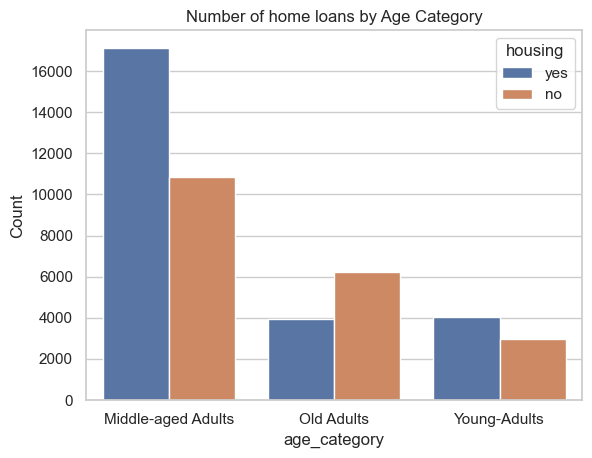

In [212]:
sns.barplot(x = "age_category", y="value", data = temp_df2,
             hue="housing", dodge = True)
plt.title('Number of home loans by Age Category')
plt.ylabel('Count')
plt.show()

In [210]:
# Getting ratio of people with home loans across categories
housing_loan_df = pd.DataFrame(merged_df.groupby('age_category')['housing'].value_counts().unstack()['yes']).reset_index()
housing_loan_df['yes'] = housing_loan_df['yes'].div(housing_loan_df['yes'].sum())
housing_loan_df

,age_category,yes
0,Middle-aged Adults,0.681766
1,Old Adults,0.157027
2,Young-Adults,0.161207


In [211]:
fig = px.pie(housing_loan_df, values = 'yes', names = 'age_category', color_discrete_sequence = px.colors.sequential.RdBu, opacity = 0.7, hole = 0.5,
            title = 'Percentage of home loans across Age Groups') 
fig.show()

## 6. Income and Age Relationship

Investigate any relationships between annual income and age group. Use
appropriate plots and statistics to present the findings.

In [214]:
fig = px.box(merged_df, x = 'age_category', y = 'Annual Income', title = 'Income Distribution across Age Groups')
fig.show()

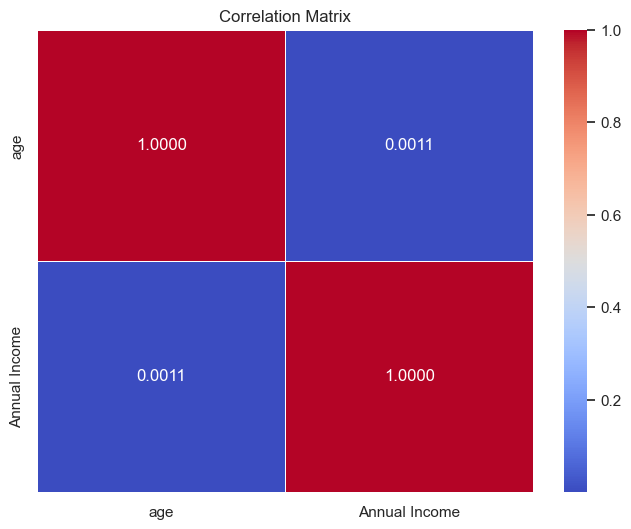

In [117]:
# Correlation matrix
correlation_matrix = merged_df[['age', 'Annual Income']].corr()
# Create a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, fmt='.4f', cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

ANOVA is used to check if there is a relationship between Annual Income and Age Groups

- H0: There is no relationship. That is, the mean Annual Income across the three age groups are equal.
- H1: There is a relationship. That is, the mean Annual Income  across the three age groups are not equal.

The following are the assumptions in anova:
1) Independence assumption: all groups are mutually exclusive, i.e. an individual can only belong in one group. 
2) Normality: The response variable is approximately normally distributed for each category of the independent variable.
3) Homogeneity of variance: Homogeneity means that the variance among the groups should be approximately equal.

1) Independence assumption

The independence assumption is satisfied as one customer can only belong to one age group.

2. Normality  Assumption

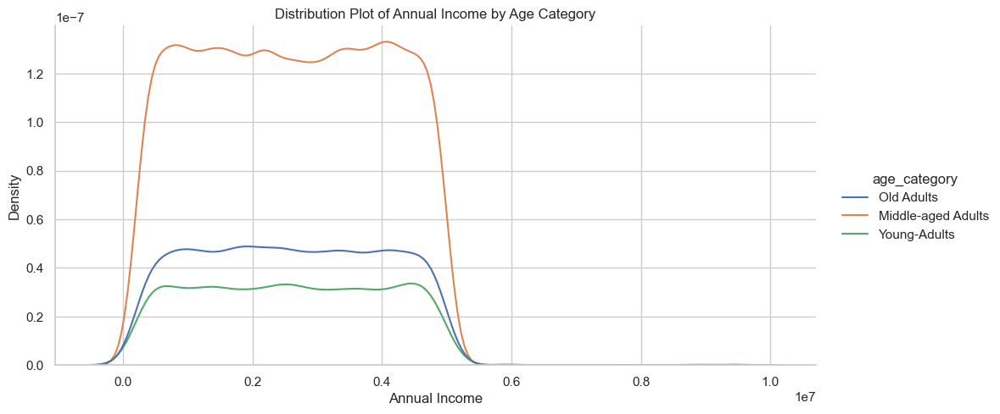

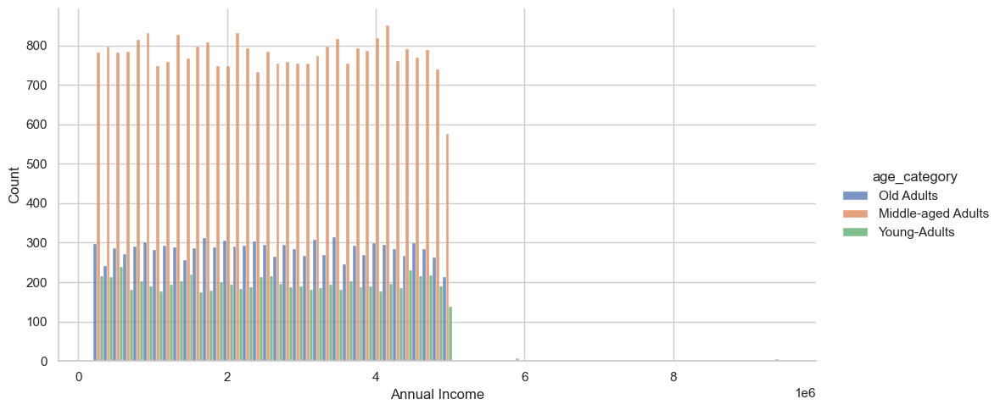

In [217]:
# checking normality assumption
%matplotlib inline
sns.displot(merged_df,x='Annual Income',hue='age_category',kind='kde',height=5,aspect=2)
plt.title('Distribution Plot of Annual Income by Age Category')
sns.displot(merged_df,x='Annual Income',hue='age_category',multiple='dodge',height=5,aspect=2)

The data follows multimodal normal distribution. Even otherwise, considering the large sample size, the data is likely to meet the assumptions of normality, under Central Limit Theorem.

3. Homogeneity of variance

In [220]:
label_encoder = LabelEncoder()
age_category_encoded = label_encoder.fit_transform(merged_df['age_category'])

# Perform Levene's test
from scipy.stats import levene

levene_test = levene(np.log1p(merged_df['Annual Income']), age_category_encoded)

print(f'Levene\'s Test Statistic: {levene_test.statistic}')
print(f'p-value: {levene_test.pvalue}')


Levene's Test Statistic: 90.80146028063336
p-value: 1.625778824583818e-21


In [120]:
merged_df['age_category'].unique()

array(['Old Adults', 'Middle-aged Adults', 'Young-Adults'], dtype=object)

In [221]:
welch_test = f_oneway(np.log1p(merged_df['Annual Income'])[merged_df['age_category'] == 'Young-Adults'],
                      np.log1p(merged_df['Annual Income'])[merged_df['age_category'] == 'Middle-aged Adults'],
                      np.log1p(merged_df['Annual Income'])[merged_df['age_category'] == 'Old Adults'])

print(f'Welch\'s ANOVA Statistic: {welch_test.statistic}')
print(f'p-value: {welch_test.pvalue}')


Welch's ANOVA Statistic: 1.2140604251974105
p-value: 0.2969986109813302


- The p-value of 0.8589 is greater than the common significance level of 0.05, Therefore we do not reject the null hypothesis.
- There is insufficient evidence to conclude that the means are different across groups, even when considering potential unequal variances.
- Therefore, we can conclude that the means of the groups are equal, imlying no linear relationship. 

In [122]:
# Correlation matrix
correlation_matrix = merged_df[['age', 'Annual Income']].corr()
print(correlation_matrix)

                    age  Annual Income
age            1.000000       0.001102
Annual Income  0.001102       1.000000


There is a very weak correlation between "age" and "Annual Income," suggesting that changes in one variable are not strongly associated with changes in the other.

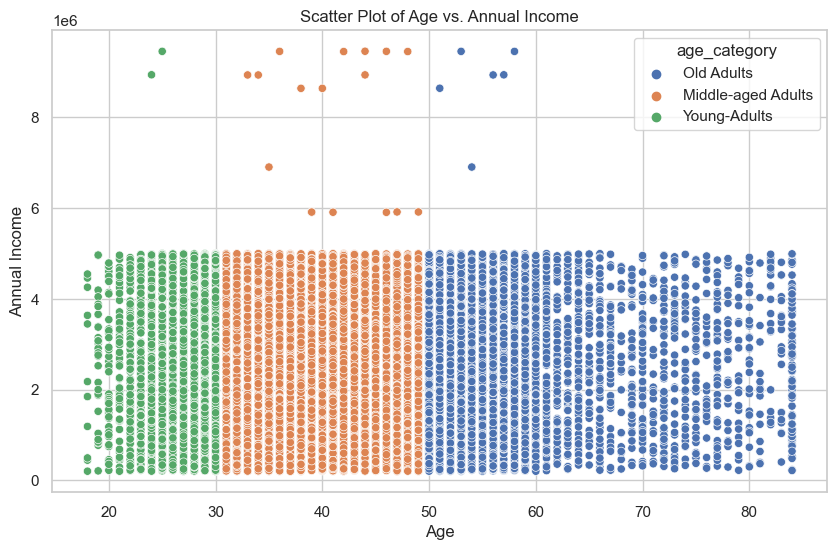

In [123]:
# Scatter plot to look for relationships
plt.figure(figsize=(10, 6))
sns.scatterplot(x='age', y='Annual Income', data=merged_df, hue='age_category')
plt.title('Scatter Plot of Age vs. Annual Income')
plt.xlabel('Age')
plt.ylabel('Annual Income')
plt.show()

Interpretation:
- There is a lot of variation in income within each age group. This means that there are some older adults with low incomes and some younger adults with high incomes. This is likely due to a number of factors, such as education, occupation, and location.
- There is no strict linear or non-linear relationship observed.
- Middle-aged adults tend to get higher income brackets compared to other two groups.

# Modeling 

## 1. Term Deposit and Related Variables:

Identify variables strongly related to Term Deposit. Discuss your approach when the
variable is categorical. Which tests or metrics will you employ?

#### Numerical feature variables

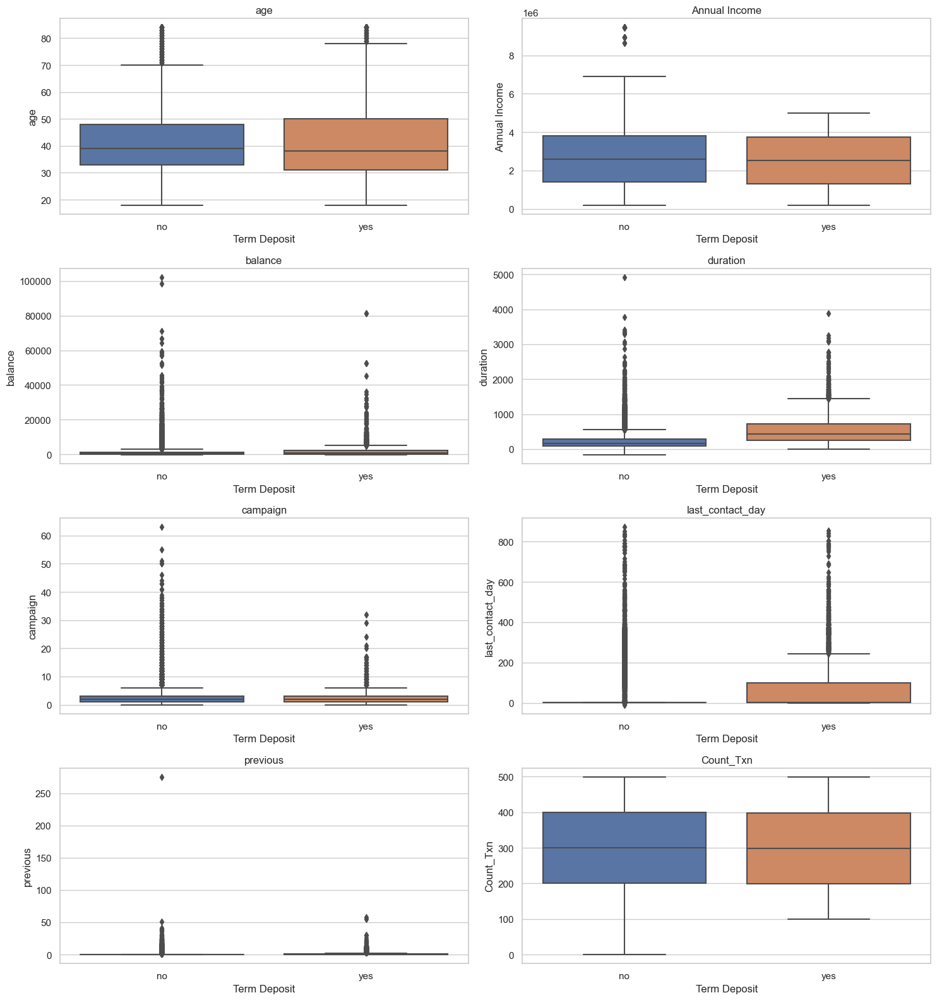

In [124]:
num_rows = len(numerical_cols)//2
num_cols = 2  # 2 columns: one for 'No Term Deposit' and one for 'Term Deposit'

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 4 * num_rows))

# Iterating through numerical columns and creating box plots
for i, col in enumerate(numerical_cols):
    sns.boxplot(x='Term Deposit', y=col, data=merged_df, ax=axes[i // num_cols, i % num_cols])
    axes[i // num_cols, i % num_cols].set_title(col)

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()

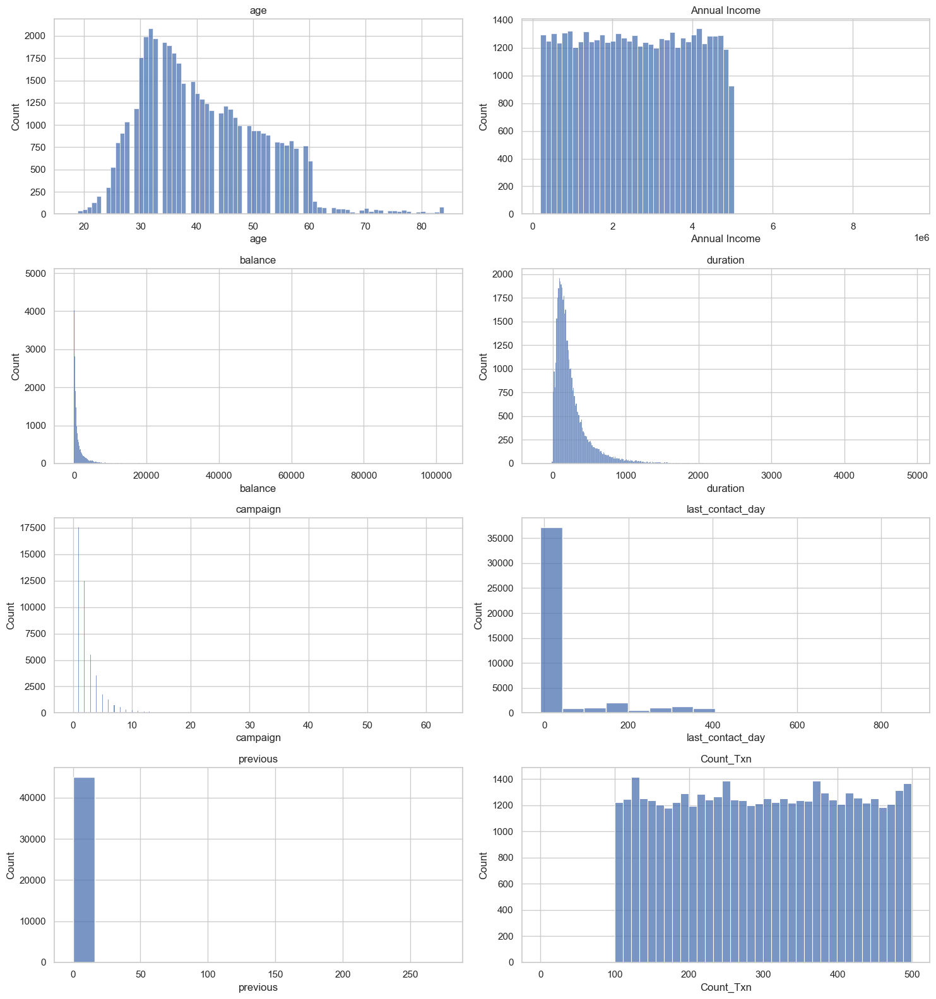

In [125]:
# Analyzing distribution of numerical features

# Creating subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 4 * num_rows))

# Iterating through numerical columns and create box plots
for i, col in enumerate(numerical_cols):
    sns.histplot(x= col,  data=merged_df, ax=axes[i // num_cols, i % num_cols])
    axes[i // num_cols, i % num_cols].set_title(col)

plt.tight_layout()
# Show plot
plt.show()

In [128]:
for col in numerical_cols:
    print(f"{col} and Term Deposit")
    # Separate the data into two groups based on 'Term Deposit'
    group_0 = merged_df[merged_df['Term Deposit'] == 'no'][col]
    group_1 = merged_df[merged_df['Term Deposit'] == 'yes'][col]

    # Perform Mann-Whitney U test
    u_statistic, p_value = stats.mannwhitneyu(group_0, group_1)

    print(f'Mann-Whitney U Statistic: {u_statistic}')
    print(f'P-Value: {p_value}')
    print("\n")

    if p_value < 0.05:
        print(f"There is no relationship between Term Deposit and {col}")
        print(f"That is the distribution of {col} between individuals who have taken a term deposit and those who have not are the same.")
    else:
        print(f"There is a relationship between Term Deposit and {col}")
        print(f"That is the distribution of {col} between individuals who have taken a term deposit and those who have not are different.")

    print("-"*120)

age and Term Deposit
Mann-Whitney U Statistic: 107184649.0
P-Value: 0.06400807054965409


There is a relationship between Term Deposit and age
That is the distribution of age between individuals who have taken a term deposit and those who have not are different.
------------------------------------------------------------------------------------------------------------------------
Annual Income and Term Deposit
Mann-Whitney U Statistic: 107932133.5
P-Value: 0.007153913539963138


There is no relationship between Term Deposit and Annual Income
That is the distribution of Annual Income between individuals who have taken a term deposit and those who have not are the same.
------------------------------------------------------------------------------------------------------------------------
balance and Term Deposit
Mann-Whitney U Statistic: 88661993.0
P-Value: 6.759878199152034e-80


There is no relationship between Term Deposit and balance
That is the distribution of balance between indi

**Thus, two variables - Age and Number of transactions has shown to have relationship with Term Deposit**

## Categorical Features

In [225]:
merged_df.drop(['any_loan'], axis = 1, inplace = True)

In [234]:
#list of categorical columns
categorical_cols = merged_df.select_dtypes(["object"]).columns.tolist()
categorical_cols.remove('Term Deposit')
categorical_cols

['job',
 'marital',
 'education',
 'Gender',
 'Insurance',
 'housing',
 'loan',
 'contact',
 'poutcome',
 'age_category']

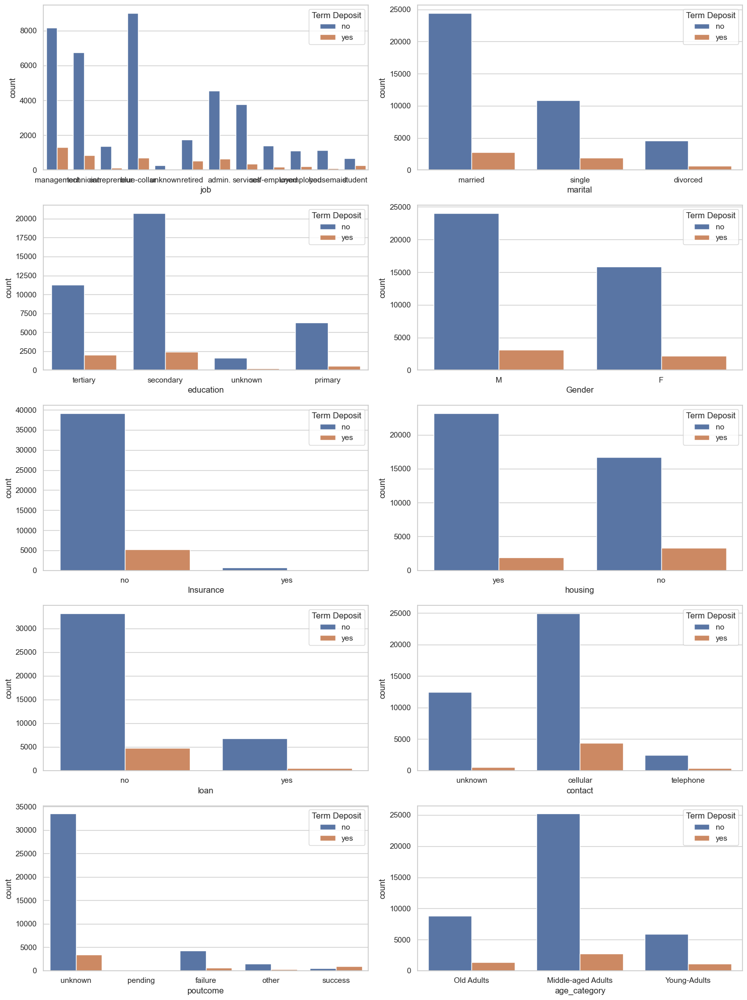

In [304]:
num_rows = len(categorical_cols)//2
num_cols = 2  # 2 columns: one for 'No Term Deposit' and one for 'Term Deposit'

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 4 * num_rows))


# Iterate through numerical columns and create box plots
for i, col in enumerate(categorical_cols):
    sns.countplot(x = col, hue ='Term Deposit', data=merged_df, ax=axes[i // num_cols, i % num_cols])

plt.tight_layout()
plt.show()

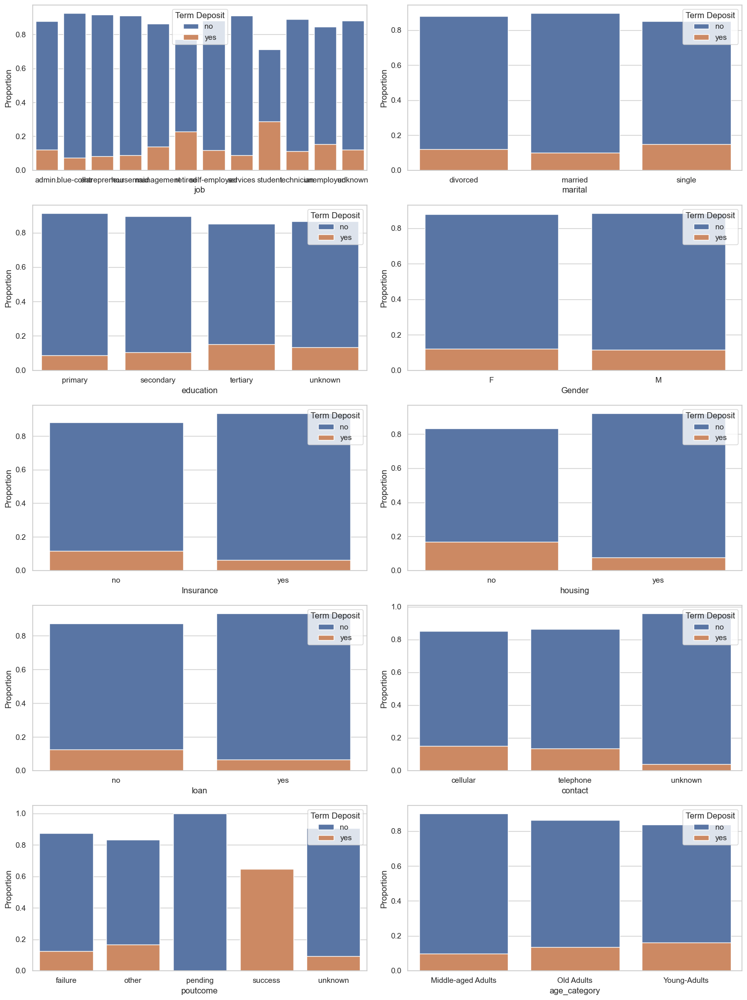

In [303]:
# Stacked bar plot
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 4 * num_rows))

for i, col in enumerate(categorical_cols):
    temp_df3 = pd.DataFrame(merged_df.groupby(col)['Term Deposit'].value_counts(normalize = True))
    temp_df3.rename(columns = {'Term Deposit': 'value'}, inplace = True)
    temp_df3.reset_index(inplace = True)
    sns.barplot(x= col , y='value', hue='Term Deposit', dodge=False, data=temp_df3, ax=axes[i // num_cols, i % num_cols])
    axes[i // num_cols, i % num_cols].set_ylabel("Proportion")
plt.tight_layout()
plt.show()

In [237]:
for col in categorical_cols:
    print(f"{col} and Term Deposit")
    # Create a contingency table
    contingency_table = pd.crosstab(merged_df[col], merged_df['Term Deposit'])
    
    # Perform the chi-square test
    chi2_stat, p_value, _, _ = chi2_contingency(contingency_table)
    
    # Calculate Cramér's V
    n = contingency_table.sum().sum()
    k, r = contingency_table.shape
    v = np.sqrt(chi2_stat/ (n * min(k-1, r-1)))

    print(f"Cramér's V: {v}")

    # Print the results
    print(f'Chi-Square Statistic: {chi2_stat}')
    print(f'P-Value: {p_value}')

    # Interpret the results
    if p_value < 0.05:
        print('There is a significant relationship between the variables.')
    else:
        print('There is no significant relationship between the variables.')
    print("-"*120)

job and Term Deposit
Cramér's V: 0.13592856157656005
Chi-Square Statistic: 835.1965678442817
P-Value: 5.23143659112277e-172
There is a significant relationship between the variables.
------------------------------------------------------------------------------------------------------------------------
marital and Term Deposit
Cramér's V: 0.06603900562184567
Chi-Square Statistic: 197.13707536199237
P-Value: 1.5567826967283564e-43
There is a significant relationship between the variables.
------------------------------------------------------------------------------------------------------------------------
education and Term Deposit
Cramér's V: 0.07259409254965575
Chi-Square Statistic: 238.21539245130026
P-Value: 2.314309948198903e-51
There is a significant relationship between the variables.
------------------------------------------------------------------------------------------------------------------------
Gender and Term Deposit
Cramér's V: 0.009517692850560412
Chi-Square Statist

In [158]:
fig = px.box(merged_df, x='Term Deposit', y='duration', color = 'age_category', title = "Duration distribution across Age groups by Term Deposit")
fig.show()

In [155]:
fig = px.box(merged_df, x='Term Deposit', y='balance', color = 'age_category', title = "Balance distribution across Age groups by Term Deposit")
fig.show()

## 2. Predictive Model Building

Train a prediction model of your choice to estimate the probability that a customer
will opt for a term deposit. Adhere to an 80:20 train:test split. Report and present
the model&#39;s performance metrics on both the train and test datasets.

#  Encoding Categorical Variables

In [133]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45196 entries, 0 to 45210
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   age               45196 non-null  int64  
 1   job               45196 non-null  object 
 2   marital           45196 non-null  object 
 3   education         45196 non-null  object 
 4   Annual Income     45196 non-null  float64
 5   Gender            45196 non-null  object 
 6   Insurance         45196 non-null  object 
 7   balance           45196 non-null  float64
 8   housing           45196 non-null  object 
 9   loan              45196 non-null  object 
 10  contact           45196 non-null  object 
 11  duration          45196 non-null  float64
 12  campaign          45196 non-null  int64  
 13  last_contact_day  45196 non-null  int64  
 14  previous          45196 non-null  int64  
 15  poutcome          45196 non-null  object 
 16  Term Deposit      45196 non-null  object

In [305]:
# Label encoding ( since education can be considered as ordinal)
education_mapping = {'unknown': 0, 'primary': 1, 'secondary': 2, 'tertiary': 3}
merged_df['education'] = merged_df['education'].map(education_mapping)

In [306]:
termdeposit_mapping = {'no': 0, 'yes': 1}
merged_df['Term Deposit'] = merged_df['Term Deposit'].map(termdeposit_mapping)

In [307]:
#Converting Categorical columns into one hot encoding
#Creating dummy variables
encoded = pd.get_dummies(merged_df[categorical_cols],drop_first=True)
encoded.head()

,education,job_blue-collar,job_entrepreneur,job_housemaid,job_management,job_retired,job_self-employed,job_services,job_student,job_technician,...,housing_yes,loan_yes,contact_telephone,contact_unknown,poutcome_other,poutcome_pending,poutcome_success,poutcome_unknown,age_category_Old Adults,age_category_Young-Adults
0,3,0,0,0,1,0,0,0,0,0,...,1,0,0,1,0,0,0,1,1,0
1,2,0,0,0,0,0,0,0,0,1,...,1,0,0,1,0,0,0,1,0,0
2,0,0,1,0,0,0,0,0,0,0,...,1,1,0,1,0,0,0,1,0,0
3,0,1,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0


In [308]:
#concat newly created columns with original dataframe
data=pd.concat([merged_df,encoded],axis=1)
#Drop original columns
data.drop(categorical_cols,axis=1,inplace=True)

In [309]:
data.sample(5)

,age,Annual Income,balance,duration,campaign,last_contact_day,previous,Term Deposit,Count_Txn,job_blue-collar,...,housing_yes,loan_yes,contact_telephone,contact_unknown,poutcome_other,poutcome_pending,poutcome_success,poutcome_unknown,age_category_Old Adults,age_category_Young-Adults
40967,29,1359410.0,314.0,485.0,3,105,1,0,365.0,0,...,0,0,0,0,0,0,1,0,0,1
9533,33,815354.0,327.0,562.0,2,1,0,0,145.0,0,...,1,1,0,1,0,0,0,1,0,0
468,55,1725638.0,52.0,182.0,1,1,0,0,104.0,1,...,1,0,0,1,0,0,0,1,1,0
17877,42,234736.0,0.0,458.0,3,1,0,0,297.0,0,...,0,0,0,0,0,0,0,1,0,0
11645,45,3679276.0,0.0,50.0,2,1,0,0,303.0,0,...,1,0,0,1,0,0,0,1,0,0


In [310]:
data.columns

Index(['age', 'Annual Income', 'balance', 'duration', 'campaign',
       'last_contact_day', 'previous', 'Term Deposit', 'Count_Txn',
       'job_blue-collar', 'job_entrepreneur', 'job_housemaid',
       'job_management', 'job_retired', 'job_self-employed', 'job_services',
       'job_student', 'job_technician', 'job_unemployed', 'job_unknown',
       'marital_married', 'marital_single', 'Gender_M', 'Insurance_yes',
       'housing_yes', 'loan_yes', 'contact_telephone', 'contact_unknown',
       'poutcome_other', 'poutcome_pending', 'poutcome_success',
       'poutcome_unknown', 'age_category_Old Adults',
       'age_category_Young-Adults'],
      dtype='object')

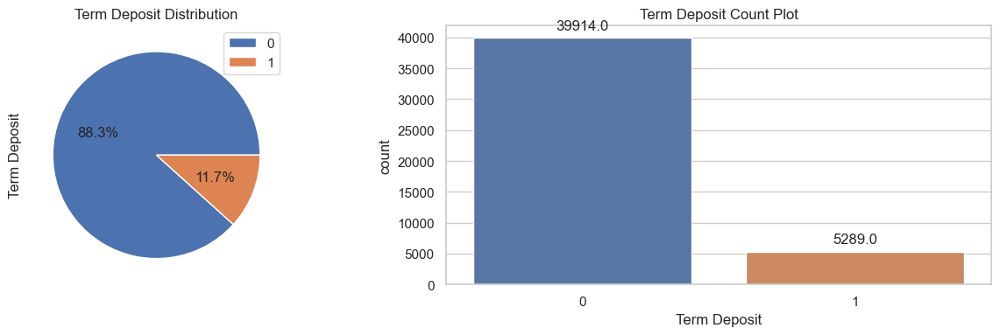

In [311]:
fig = plt.figure(figsize=(13, 4))

# Pie Chart
ax1 = fig.add_subplot(1, 2, 1)
merged_df["Term Deposit"].value_counts(normalize=True).plot.pie(autopct='%1.1f%%', labels=None)
ax1.set_title("Term Deposit Distribution")

# Add labels to the Pie Chart
labels = merged_df["Term Deposit"].value_counts().index
plt.legend(labels, loc="upper right")

# Count Plot
ax2 = fig.add_subplot(1, 2, 2)
sns.countplot(x=merged_df["Term Deposit"])

# Adding labels to the Count Plot
for p in ax2.patches:
    ax2.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='center', xytext=(0, 10), textcoords='offset points')

ax2.set_title("Term Deposit Count Plot")
plt.tight_layout()
plt.show()


In [449]:
X = data.drop(['Term Deposit'], axis = 1)
y = data['Term Deposit']

In [450]:
scaler = RobustScaler()
X = scaler.fit_transform(X)

In [451]:
# Train-test split
X_train,X_test,y_train,y_test = train_test_split(X, y, random_state = 100, train_size=0.8)
# getting shape of train and test data
print("train size X : ",X_train.shape)
print("train size y : ",y_train.shape)
print("test size X : ",X_test.shape)
print("test size y : ",y_test.shape)

train size X :  (36162, 33)
train size y :  (36162,)
test size X :  (9041, 33)
test size y :  (9041,)


<Axes: xlabel='Term Deposit', ylabel='count'>

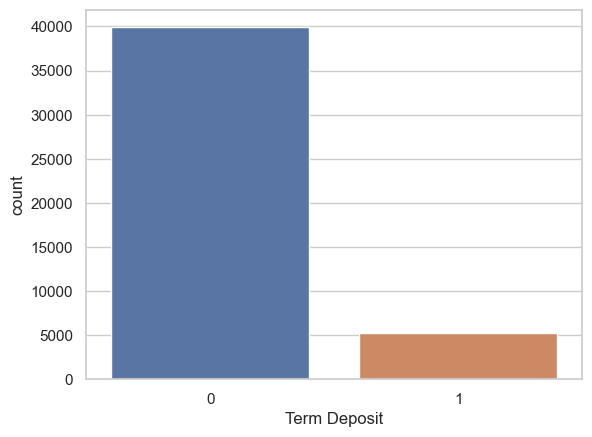

In [452]:
#BEFORE SMOTE:

sns.countplot(data = merged_df, x='Term Deposit')


Before OverSampling, the shape of X_train: (36162, 33)
Before OverSampling, the shape of y_train: (36162,)
After OverSampling, the shape of X_train_over: (63928, 33)
After OverSampling, the shape of y_train_over: (63928,)


<Axes: xlabel='Term Deposit', ylabel='count'>

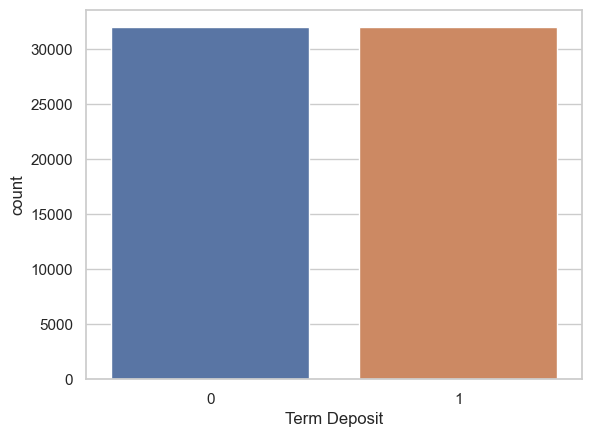

In [453]:
sm = SMOTE(k_neighbors=5, random_state = 0)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)
print('Before OverSampling, the shape of X_train: {}'.format(X_train.shape))
print('Before OverSampling, the shape of y_train: {}'.format(y_train.shape))
print('After OverSampling, the shape of X_train_over: {}'.format(X_train_over.shape))
print('After OverSampling, the shape of y_train_over: {}'.format(y_train_over.shape))
#AFTER SMOTE
y_train_over_df = y_train_over.to_frame()
sns.countplot(data=y_train_over_df, x='Term Deposit')

### Assumptions Validation

In [486]:
total = numerical_cols + ['Term Deposit']
total

['age',
 'Annual Income',
 'balance',
 'duration',
 'campaign',
 'last_contact_day',
 'previous',
 'Count_Txn',
 'Term Deposit']

In [487]:
num_df = merged_df[total]
for col in numerical_cols:
    num_df.drop(num_df[num_df[col] == 0].index, inplace = True)

In [489]:
log_vars = []
for var in numerical_cols:
    num_df[f'{var}:Log_{var}'] = num_df[var].apply(lambda x: x * np.log(x)) #np.log = natural log
    log_vars.append(f'{var}:Log_{var}')

num_df.head()

,age,Annual Income,balance,duration,campaign,last_contact_day,previous,Count_Txn,Term Deposit,age:Log_age,Annual Income:Log_Annual Income,balance:Log_balance,duration:Log_duration,campaign:Log_campaign,last_contact_day:Log_last_contact_day,previous:Log_previous,Count_Txn:Log_Count_Txn
24060,33,327843.0,882.0,39.0,1,151,3,105.0,0,115.384750,4.163701e+06,5981.893393,142.878904,0.0,757.609255,3.295837,488.665837
24062,42,1730402.0,247.0,519.0,1,166,1,239.0,1,156.982124,2.485526e+07,1360.818919,3244.738115,0.0,848.589973,0.000000,1308.874789
24064,33,2673189.0,3444.0,144.0,1,91,4,131.0,1,115.384750,3.955994e+07,28049.275253,715.653115,0.0,410.488215,5.545177,638.650849
24072,36,2862885.0,2415.0,73.0,1,86,4,449.0,0,129.006682,4.256349e+07,18811.532777,313.203539,0.0,383.073867,5.545177,2742.053277
24080,56,4311028.0,589.0,518.0,1,147,2,250.0,1,225.419695,6.585823e+07,3756.893022,3237.487175,0.0,733.593590,1.386294,1380.365229


In [492]:
num_df.dropna(inplace = True)

In [493]:
import statsmodels.api as sm
from statsmodels.genmod import families
from statsmodels.genmod.generalized_linear_model import GLM
# Redefine independent variables to include interaction terms
X_lt = num_df.drop(['Term Deposit'], axis = 1)
y_lt = num_df['Term Deposit']

# Add constant
X_lt = sm.add_constant(X_lt, prepend=False)
  
# Build model and fit the data (using statsmodel's Logit)
logit_results = GLM(y_lt, X_lt, family=families.Binomial()).fit()

# Display summary results
print(logit_results.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:           Term Deposit   No. Observations:                 7806
Model:                            GLM   Df Residuals:                     7789
Model Family:                Binomial   Df Model:                           16
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3422.5
Date:                Fri, 15 Dec 2023   Deviance:                       6845.0
Time:                        00:39:53   Pearson chi2:                 7.28e+03
No. Iterations:                     6   Pseudo R-squ. (CS):             0.1858
Covariance Type:            nonrobust                                         
                                            coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------

In [475]:
model =LogisticRegression(max_iter = 1000)

In [476]:
model.fit(X_train_over,y_train_over)

LogisticRegression(max_iter=1000)

In [477]:
y_pred_model = model.predict(X_test)

In [478]:
print("f1 score for base model is : " , f1_score(y_test, y_pred_model))

f1 score for base model is :  0.530359355638166


In [479]:
# Accuracy on Train
print("The Training Accuracy is: ", model.score(X_train_over, y_train_over))

# Accuracy on Test
print("The Testing Accuracy is: ", model.score(X_test, y_test))


# Classification Report
print(classification_report(y_test, y_pred_model))

The Training Accuracy is:  0.8304185959204105
The Testing Accuracy is:  0.8323194336909634
              precision    recall  f1-score   support

           0       0.97      0.84      0.90      7950
           1       0.40      0.78      0.53      1091

    accuracy                           0.83      9041
   macro avg       0.68      0.81      0.71      9041
weighted avg       0.90      0.83      0.85      9041



In [480]:
# Confusion Matrix function
def plot_confusion_matrix(cm, classes=None, title='Confusion matrix'):
    """Plots a confusion matrix."""
    if classes is not None:
        sns.heatmap(cm, cmap="YlGnBu", xticklabels=classes, yticklabels=classes, vmin=0., vmax=1., annot=True, annot_kws={'size':20})
    else:
        sns.heatmap(cm, vmin=0., vmax=1.)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

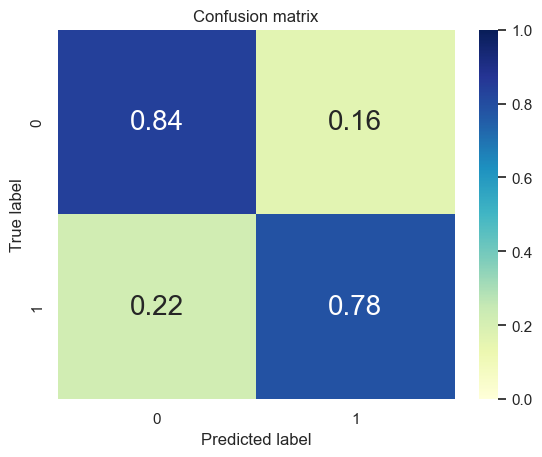

In [481]:
# Visualizing cm

cm = confusion_matrix(y_test, y_pred_model)
cm_norm = cm / cm.sum(axis=1).reshape(-1,1)

plot_confusion_matrix(cm_norm, classes = model.classes_, title='Confusion matrix')

In [482]:
# Running Log loss on training
print("The Log Loss on Training is: ", log_loss(y_train, model.predict_proba(X_train)))

# Running Log loss on testing
pred_proba_t = model.predict_proba(X_test)
print("The Log Loss on Testing Dataset is: ", log_loss(y_test, pred_proba_t))

The Log Loss on Training is:  0.4320113903499909
The Log Loss on Testing Dataset is:  0.4473804162957717


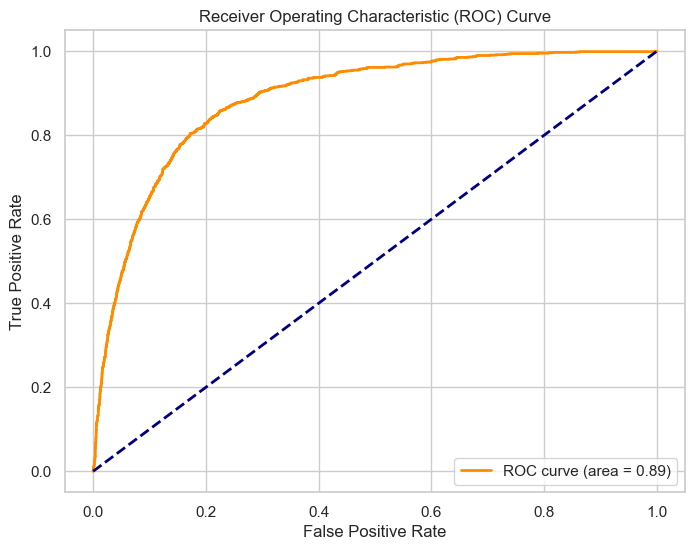

In [483]:
y_pred_prob = model.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

# Plotting the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

## 3. Model Improvement Strategies

Discuss potential methods or approaches to enhance model performance. This could
include feature engineering, different algorithms, or refining the data preprocessing
steps.

### Using classweight 

In [466]:
basemodel = LogisticRegression(class_weight={0:0.1,1:0.9}, max_iter=1000)

In [467]:
# training the model
basemodel.fit(X_train,y_train)

LogisticRegression(class_weight={0: 0.1, 1: 0.9}, max_iter=1000)

In [468]:
y_pred_basemodel = basemodel.predict(X_test)

In [469]:
print(f'The f1 score of the model is : {round(f1_score(y_test, y_pred_basemodel), 2)}')

The f1 score of the model is : 0.51


In [470]:
# Accuracy on Train
print("The Training Accuracy is: ", basemodel.score(X_train, y_train))

# Accuracy on Test
print("The Testing Accuracy is: ", basemodel.score(X_test, y_test))


# Classification Report
print(classification_report(y_test, y_pred_basemodel))

The Training Accuracy is:  0.8139759969028262
The Testing Accuracy is:  0.8098661652472071
              precision    recall  f1-score   support

           0       0.97      0.81      0.88      7950
           1       0.37      0.82      0.51      1091

    accuracy                           0.81      9041
   macro avg       0.67      0.81      0.70      9041
weighted avg       0.90      0.81      0.84      9041



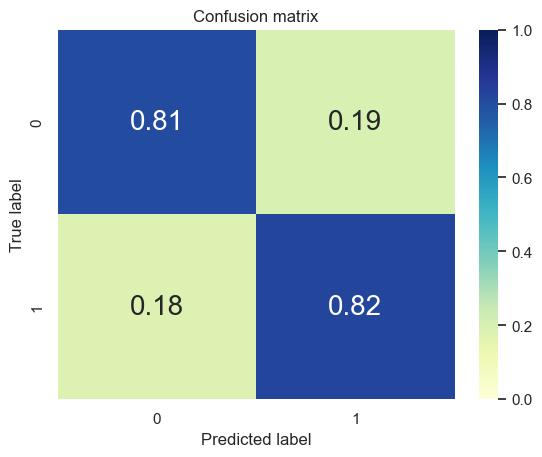

In [471]:
# Visualizing cm

cm = confusion_matrix(y_test, y_pred_basemodel)
cm_norm = cm / cm.sum(axis=1).reshape(-1,1)

plot_confusion_matrix(cm_norm, classes = basemodel.classes_, title='Confusion matrix')

In [474]:
# Running Log loss on training
print("The Log Loss on Training is: ", log_loss(y_train, basemodel.predict_proba(X_train)))

# Running Log loss on testing
pred_proba_t = basemodel.predict_proba(X_test)
print("The Log Loss on Testing Dataset is: ", log_loss(y_test, pred_proba_t))


The Log Loss on Training is:  0.4751699715036886
The Log Loss on Testing Dataset is:  0.4907941281084476


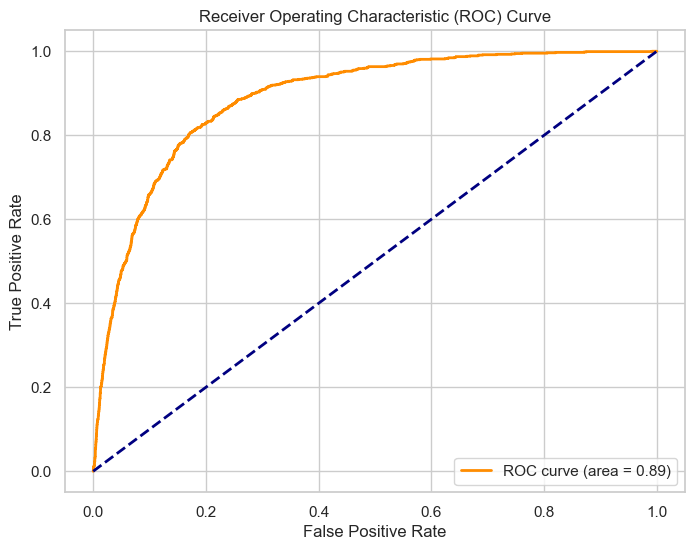

In [473]:
y_pred_prob = basemodel.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

# Plotting the ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


The model is performing very well since ROC score is 0.88.

In [162]:
clf=RandomForestClassifier()

In [163]:
clf.fit(X_train, y_train) # model fitting

RandomForestClassifier()

In [164]:
# predicting values
preds = clf.predict(X_test)

In [165]:
print (clf.score(X_train, y_train)) # train accuracy
print(clf.score(X_test, y_test)) # test accuracy

1.0
0.8955752212389381


There is quite high difference between training and testing accuracy in the Random Forest Model, this model is overfitting the data. It is best to go ahead with the Logistic Regression Model with high accuracy and good ROC score.